<a href="https://colab.research.google.com/github/hisunnytang/someastroml/blob/main/halos_flows.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Generative Models for Halos
## intuition: massive halos are often observed
Given the massive ones, can we effectively infer the properties of the less massive ones. Like language model, where we can generate the rest of the sentence/ paragraph conditioning on the first few inputs.

Mathematically, what we want to find is probabilistic maximum likelihood function of halos $x_h$, given the observed halos $x_i$. the ordering could possibly come from luminosity/ likelihood of observations/ properties of the haloes, better still if they are treated as sets. 

\begin{equation}
P(x_h | x_0, x_1 ..., x_i \theta)
\end{equation}



- **Transformer-like GPT**, where the ordering is through the halo mass, i.e. conditional the less massive halos on the most massive halos
  - seuquence generation, but not really a sequence
  - if we ignored the positional encoding, it is essentially set-transfomer
- **Graph-Based generative models**:
  - Disadvantage: it cannot be too deep...
  - few passes would have diluted the 
  - assigning nodes based on connection based on fiducial criteria (KNN/ raidus graph)
- **Set-Based**:
  - inherently halos are permutation invariants, like sets
  - **PointNet** like: treat haloes as  points like pointnet


## Papers:
  - [Sequence Generation](GPT-2)
  - [PointFlow 3d](https://arxiv.org/abs/1906.12320)
  - [Generative Adversarial Set Transformers](https://oolworkshop.github.io/program/ool_32.html)
  - [Conditional Set Generation with Transformers](https://arxiv.org/pdf/2006.16841.pdf)



## PointFlow
### Basic Model Outline
- a VAE $Q_{\phi}(z| X)$ that encode a point cloud to shape representation $z$
- a prior of $z$ $P_\psi(z)$ over shape representations
- a decoder $P_\theta(X| z)$ that models the distribution of points given the shape representation
- Flow is the way of transforming a simple distribution to all the complex integration, they use continuius time flow to model the prior and decoder.
- loss function is log likelihood of X: $P_\theta(X)$
  - the KL divergence between the encoder and prior
  - the reconstruction loss

### Halo Catalog Analogy
- x: halos with $(x,y,z, vx,vy,vz, M, J, ...)$
- z: the latent representation of cluster of halos



# Data Exploration First

In [ ]:
!pip install halotools

     |████████████████████████████████| 7.6MB 7.0MB/s 
  Created wheel for halotools: filename=halotools-0.7-cp36-cp36m-linux_x86_64.whl size=12324514 sha256=ce39f697154adfa24432207c0d4c636421139bd5c9729370d196160cf2d5951c
  Stored in directory: /root/.cache/pip/wheels/3b/26/26/ff4836e61ef2c57dbe7c5a7dea596ca7e84b23f1bba01b719c
Successfully built halotools


In [ ]:
from halotools.sim_manager import DownloadManager
from halotools.sim_manager import sim_defaults
from halotools.sim_manager import CachedHaloCatalog

halocat = CachedHaloCatalog(update_cached_fname=True,
                            fname = "/content/drive/My Drive/halo_network/hlist_1.00035.list.halotools_v0p4.hdf5")

In [ ]:
halocat.halo_table.colnames

['halo_vmax_firstacc',
 'halo_dmvir_dt_tdyn',
 'halo_macc',
 'halo_scale_factor',
 'halo_vmax_mpeak',
 'halo_m_pe_behroozi',
 'halo_xoff',
 'halo_spin',
 'halo_scale_factor_firstacc',
 'halo_c_to_a',
 'halo_mvir_firstacc',
 'halo_scale_factor_last_mm',
 'halo_scale_factor_mpeak',
 'halo_pid',
 'halo_m500c',
 'halo_id',
 'halo_halfmass_scale_factor',
 'halo_upid',
 'halo_t_by_u',
 'halo_rvir',
 'halo_vpeak',
 'halo_dmvir_dt_100myr',
 'halo_mpeak',
 'halo_m_pe_diemer',
 'halo_jx',
 'halo_jy',
 'halo_jz',
 'halo_m2500c',
 'halo_mvir',
 'halo_voff',
 'halo_axisA_z',
 'halo_axisA_x',
 'halo_axisA_y',
 'halo_y',
 'halo_b_to_a',
 'halo_x',
 'halo_z',
 'halo_m200b',
 'halo_vacc',
 'halo_scale_factor_lastacc',
 'halo_vmax',
 'halo_m200c',
 'halo_vx',
 'halo_vy',
 'halo_vz',
 'halo_dmvir_dt_inst',
 'halo_rs',
 'halo_nfw_conc',
 'halo_hostid',
 'halo_mvir_host_halo']

In [ ]:
import numpy as np
import pandas as pd

df_halos = pd.DataFrame(halocat.halo_table.as_array())

In [ ]:
count = df_halos['halo_hostid'].value_counts()

Text(0, 0.5, 'Count of halo clusters')

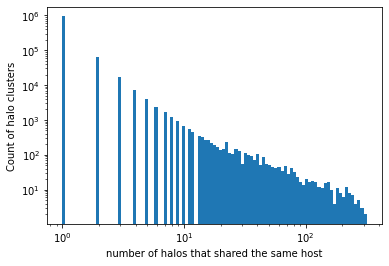

In [ ]:
import matplotlib.pyplot as plt
count = df_halos['halo_hostid'].value_counts()
bins = np.logspace(0,2.5, 100)
plt.hist(count.values, bins=bins)
plt.yscale('log')
plt.xscale('log')
plt.xlabel("number of halos that shared the same host")
plt.ylabel("Count of halo clusters")

In [ ]:
nhalos = 100
count[(count == nhalos)]

3069106681    100
3070611890    100
3068598001    100
3070766401    100
3065474321    100
3059187114    100
Name: halo_hostid, dtype: int64

In [ ]:
hid = 3070611890
halo_clusters = df_halos.loc[df_halos['halo_hostid'] == hid]

In [ ]:
halo_clusters

,halo_vmax_firstacc,halo_dmvir_dt_tdyn,halo_macc,halo_scale_factor,halo_vmax_mpeak,halo_m_pe_behroozi,halo_xoff,halo_spin,halo_scale_factor_firstacc,halo_c_to_a,halo_mvir_firstacc,halo_scale_factor_last_mm,halo_scale_factor_mpeak,halo_pid,halo_m500c,halo_id,halo_halfmass_scale_factor,halo_upid,halo_t_by_u,halo_rvir,halo_vpeak,halo_dmvir_dt_100myr,halo_mpeak,halo_m_pe_diemer,halo_jx,halo_jy,halo_jz,halo_m2500c,halo_mvir,halo_voff,halo_axisA_z,halo_axisA_x,halo_axisA_y,halo_y,halo_b_to_a,halo_x,halo_z,halo_m200b,halo_vacc,halo_scale_factor_lastacc,halo_vmax,halo_m200c,halo_vx,halo_vy,halo_vz,halo_dmvir_dt_inst,halo_rs,halo_nfw_conc,halo_hostid,halo_mvir_host_halo
1187405,767.849976,-897.200012,1.273000e+14,1.00035,785.510010,1.277000e+14,0.055758,0.02032,1.000,0.48199,1.273000e+14,0.7843,0.9344,-1,5.867600e+13,3070611890,0.7603,-1,0.6142,1.040939,878.789978,-14290.000000,1.346000e+14,1.146000e+14,-9.961000e+14,-2.951000e+15,1.335000e+13,2.961500e+13,1.273000e+14,162.330002,26.37640,37.740601,27.70900,127.147789,0.68107,240.967743,25.269569,1.491100e+14,767.849976,1.000,767.849976,9.299900e+13,247.410004,-232.529999,134.729996,-14310.000000,0.231644,4.493701,3070611890,1.273000e+14
1187481,483.260010,-5544.000000,2.528000e+13,1.00035,522.679993,1.128000e+13,0.020542,0.03324,0.760,0.45770,2.390000e+13,0.3303,0.8534,3070611890,5.994200e+12,3070611897,0.4683,3070611890,1.0790,0.401172,539.669983,-21980.000000,2.996000e+13,2.746000e+12,-5.013000e+13,5.459000e+11,-5.357000e+13,3.541300e+12,7.284000e+12,204.550003,-1.30592,14.282900,15.88780,127.164307,0.59774,240.989273,25.276060,7.542400e+12,462.750000,0.802,386.160004,6.772300e+12,-521.520020,-911.960022,-80.220001,-17790.000000,0.018915,21.209196,3070611890,1.273000e+14
1187985,332.920013,-639.799988,6.405000e+12,1.00035,344.279999,1.422000e+12,0.000755,0.04897,0.586,0.75513,6.405000e+12,0.4983,0.5684,3070611890,6.992000e+11,3070611873,0.4444,3070611890,0.5696,0.201932,375.140015,-50.459999,6.552000e+12,3.594000e+11,2.420000e+11,-3.100000e+11,1.520000e+12,4.770400e+11,9.290000e+11,18.379999,-7.51704,-4.399200,7.43712,127.108223,0.87172,240.576080,24.893530,9.993300e+11,332.920013,0.586,195.970001,8.184600e+11,377.260010,-286.359985,585.229980,589.000000,0.008926,22.622902,3070611890,1.273000e+14
1188140,189.990005,-86.620003,1.109000e+12,1.00035,196.479996,1.079000e+12,0.008040,0.01452,0.796,0.68993,1.109000e+12,0.1503,0.7603,3070611890,5.923500e+11,3070611243,0.3423,3070611890,0.6328,0.186654,206.100006,-33.110001,1.215000e+12,2.727000e+11,3.297000e+11,1.061000e+11,4.608000e+09,3.273900e+11,7.337000e+11,9.250000,9.75244,-0.887930,5.47668,126.407219,0.88766,240.824127,24.788759,7.583600e+11,189.990005,0.796,171.039993,6.821700e+11,479.019989,-852.950012,401.149994,81.080002,0.010148,18.393181,3070611890,1.273000e+14
1188267,259.940002,-597.400024,2.332000e+12,1.00035,276.950012,1.223000e+12,0.019018,0.00807,0.592,0.71566,3.327000e+12,0.3063,0.5504,3070611897,5.090700e+11,3070611896,0.4324,3070611890,0.9804,0.176430,288.019989,-427.000000,3.671000e+12,3.034000e+11,-4.961000e+11,2.217000e+11,-8.934000e+10,4.013900e+11,6.196000e+11,12.850000,-1.57264,7.757110,5.13089,127.061096,0.88479,240.917984,25.348480,6.487700e+11,231.860001,0.736,193.259995,5.704000e+11,-581.750000,-434.290009,370.140015,-534.099976,0.004102,43.010723,3070611890,1.273000e+14
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1199784,124.410004,-0.747500,1.661000e+11,1.00035,131.419998,5.687000e+09,0.004177,0.09260,0.342,0.38540,1.661000e+11,0.1923,0.3303,3070611890,2.998500e+09,3070611441,0.2283,3070611890,0.8600,0.035166,145.190002,-5.646000,1.721000e+11,2.590000e+09,3.816000e+08,9.565000e+07,9.774000e+08,5.451900e+08,4.907000e+09,5.630000,-3.04497,4.685630,-0.74864,126.827950,0.60840,240.263870,25.419380,5.315600e+09,124.410004,0.342,29.410000,4.088900e+09,302

In [ ]:
import plotly.express as px
halo_clusters['log_mass'] = np.log10(halo_clusters['halo_mvir'])
px.scatter_3d(halo_clusters, x='halo_x', y='halo_y', z='halo_z', 
              color='log_mass', size='halo_nfw_conc')

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [ ]:
mean_cluster_stat = df_halos[['halo_mvir', 'halo_hostid']].groupby("halo_hostid").agg(['mean', "count"])

In [ ]:
count_mass = mean_cluster_stat['halo_mvir']['count']
mean_mass  = mean_cluster_stat['halo_mvir']['mean']

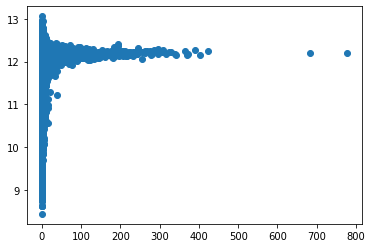

In [ ]:
plt.scatter(count_mass,  np.log10(mean_mass))

In [ ]:
features = halo_clusters[['halo_x', 'halo_y', 'halo_z', 'halo_spin', 'halo_m500c', 'halo_rvir', 
                          "halo_jx",	"halo_jy", "halo_jz", 'halo_mvir', 'halo_vacc', 'halo_vmax', 
                          "halo_vx",	"halo_vy", "halo_vz"]]

sort_sequences = features.sort_values('halo_mvir', ascending=False)

In [ ]:
sort_sequences

,halo_x,halo_y,halo_z,halo_spin,halo_m500c,halo_rvir,halo_jx,halo_jy,halo_jz,halo_mvir,halo_vacc,halo_vmax,halo_vx,halo_vy,halo_vz
1187405,240.967743,127.147789,25.269569,0.02032,5.867600e+13,1.040939,-9.961000e+14,-2.951000e+15,1.335000e+13,1.273000e+14,767.849976,767.849976,247.410004,-232.529999,134.729996
1187481,240.989273,127.164307,25.276060,0.03324,5.994200e+12,0.401172,-5.013000e+13,5.459000e+11,-5.357000e+13,7.284000e+12,462.750000,386.160004,-521.520020,-911.960022,-80.220001
1187985,240.576080,127.108223,24.893530,0.04897,6.992000e+11,0.201932,2.420000e+11,-3.100000e+11,1.520000e+12,9.290000e+11,332.920013,195.970001,377.260010,-286.359985,585.229980
1188140,240.824127,126.407219,24.788759,0.01452,5.923500e+11,0.186654,3.297000e+11,1.061000e+11,4.608000e+09,7.337000e+11,189.990005,171.039993,479.019989,-852.950012,401.149994
1188267,240.917984,127.061096,25.348480,0.00807,5.090700e+11,0.176430,-4.961000e+11,2.217000e+11,-8.934000e+10,6.196000e+11,231.860001,193.259995,-581.750000,-434.290009,370.140015
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1199784,240.263870,126.827950,25.419380,0.09260,2.998500e+09,0.035166,3.816000e+08,9.565000e+07,9.774000e+08,4.907000e+09,124.410004,29.410000,302.179993,-523.309998,231.169998
1199858,240.509323,127.305656,24.542580,0.03359,1.499300e+09,0.030721,3.347000e+08,-6.985000e+07,-1.402000e+08,3.271000e+09,67.709999,24.360001,65.000000,195.470001,-43.830002
1199867,241.031540,127.138893,25.255560,0.00367,2.998500e+09,0.029843,6.680000e+06,1.664000e+07,2.772000e+07,2.999000e+09,91.300003,48.070000,1263.469971,794.380005,167.070007
1199888,241.124832,127.531273,25.258970,0.06184,1.226700e+09,0.027912,6.018000e+07,-6.112000e+07,6.999000e+07,2.453000e+09,71.290001,22.110001,64.410004,-765.309998,269.010010


In [ ]:
c = halo_clusters.columns[~halo_clusters.columns.str.contains('id|x|y|z')]

In [ ]:
c

Index(['halo_macc', 'halo_scale_factor', 'halo_spin',
       'halo_scale_factor_firstacc', 'halo_c_to_a', 'halo_mvir_firstacc',
       'halo_scale_factor_last_mm', 'halo_scale_factor_mpeak', 'halo_m500c',
       'halo_halfmass_scale_factor', 'halo_rvir', 'halo_vpeak', 'halo_mpeak',
       'halo_m_pe_diemer', 'halo_m2500c', 'halo_mvir', 'halo_voff',
       'halo_b_to_a', 'halo_m200b', 'halo_vacc', 'halo_scale_factor_lastacc',
       'halo_m200c', 'halo_dmvir_dt_inst', 'halo_rs', 'halo_nfw_conc',
       'halo_mvir_host_halo', 'log_mass'],
      dtype='object')

In [ ]:
flag = (df_halos['halo_mvir'] > 0) & ((df_halos['halo_m500c'] > 0))

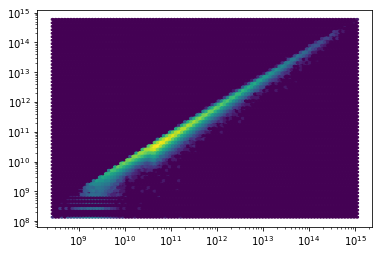

In [ ]:
plt.hexbin( df_halos['halo_mvir'][flag], df_halos['halo_m500c'][flag], 
            xscale='log', yscale='log', bins='log')

In [ ]:
import torch.nn as nn
import torch
import copy
from torch.distributions.uniform import Uniform
from torch.distributions.beta import Beta
from torch.distributions.normal import Normal
from scipy.optimize import bisect
import torch.nn.functional as F
from  torch.utils.data import TensorDataset, DataLoader


class MixtureCDFFlow(nn.Module):
    def __init__(self, 
                 base_dist='uniform', 
                 mixture_dist='gaussian',
                 n_components=4,
                 plot_bounds=(-3,3)):
        super().__init__()
        self.composition = False
        if base_dist == 'uniform':
            self.base_dist = Uniform(torch.FloatTensor([0.0]), torch.FloatTensor([1.0]))
        elif base_dist == 'beta':
            self.base_dist = Beta(torch.FloatTensor([5.0]), torch.FloatTensor([5.0])) 
        else:
            raise NotImplementedError

        self.loc = nn.Parameter(torch.randn(n_components), requires_grad=True)
        self.log_scale = nn.Parameter(torch.zeros(n_components), requires_grad=True)
        self.weight_logits = nn.Parameter(torch.zeros(n_components), requires_grad=True)
        if mixture_dist == 'gaussian':
            self.mixture_dist = Normal 
        self.n_components = n_components
        self.plot_bounds = plot_bounds

    def flow(self, x):
        # set up mixture distribution
        weights = F.softmax(self.weight_logits, dim=0).unsqueeze(0).repeat(x.shape[0], 1)
        mixture_dist = self.mixture_dist(self.loc, self.log_scale.exp())
        x_repeat = x.unsqueeze(1).repeat(1, self.n_components)

        # z = cdf of x
        z = (mixture_dist.cdf(x_repeat) * weights).sum(dim=1)

        # log_det = log dz/dx = log pdf(x)
        log_det = (mixture_dist.log_prob(x_repeat).exp() * weights).sum(dim=1).log()

        return z, log_det

    def invert(self, z):
        # Find the exact x via bisection such that f(x) = z
        results = []
        for z_elem in z:
            def f(x):
                return self.flow(torch.tensor(x).unsqueeze(0))[0] - z_elem
            x = bisect(f, -20, 20)
            results.append(x)
        return torch.tensor(results).reshape(z.shape)

    def log_prob(self, x):
        z, log_det = self.flow(x)
        return self.base_dist.log_prob(z) + log_det
 
    # Compute loss as negative log-likelihood
    def nll(self, x):
        return - self.log_prob(x).mean()
        
    def get_density(self):
        x = np.linspace(self.plot_bounds[0], self.plot_bounds[1], 1000)
        with torch.no_grad():
            y = self.log_prob(torch.FloatTensor(x)).exp().cpu().numpy()
        return x, y

    def plot(self, title):
        density = self.get_density()
        plt.figure()
        plt.plot(density[0], density[1])
        plt.title(title)

# classic multi-layer perceptron
class MLP(nn.Module):
    def __init__(self, input_size, n_hidden, hidden_size, output_size):
        super().__init__()
        layers = []
        for _ in range(n_hidden):
            layers.append(nn.Linear(input_size, hidden_size))
            layers.append(nn.ReLU())
            input_size = hidden_size
        layers.append(nn.Linear(hidden_size, output_size))
        self.layers = nn.Sequential(*layers)
    
    def forward(self, x):
        return self.layers(x)

# same CDF flow as in Demo 1, but conditioned on an auxillary variable
class ConditionalMixtureCDFFlow(nn.Module):
    def __init__(self, 
                 base_dist='gaussian', 
                 mixture_dist='gaussian',
                 n_components=4,
                 n_layers=3, 
                 hidden_size=64,
                 cond_dim=1):
        super().__init__()
        self.mlp = MLP(cond_dim, n_layers, hidden_size, n_components * 3)
        if mixture_dist == 'gaussian':
            self.mixture_dist = Normal # (self.loc, self.log_scale.exp())
        elif mixture_dist == 'logistic':
            self.mixture_dist = Logistic
        self.n_components = n_components

    def flow(self, x, cond):
        # parameters of flow on x depend on what it's conditioned on 
        loc, log_scale, weight_logits = torch.chunk(self.mlp(cond), 3, dim=1)
        weights = F.softmax(weight_logits)

        # z = cdf(x)
        z = (self.mixture_dist(loc, log_scale.exp()).cdf(x.repeat(1, self.n_components)) * weights).sum(dim=1)

        # log_det = log dz/dx = log pdf(x)
        log_det = (self.mixture_dist(loc, log_scale.exp()).log_prob(x.repeat(1, self.n_components)).exp() * weights).sum(dim=1).log()

        return z, log_det

    def invert(self, z, cond):
        # Find the exact x via bisection such that f(x) = z
        results = []
        for z_elem in z:
            def f(x):
                return self.flow(torch.tensor(x).unsqueeze(0))[0] - z_elem
            x = bisect(f, -20, 20)
            results.append(x)
        return torch.tensor(results).reshape(z.shape)

    def log_prob(self, x):
        z, log_det = self.flow(x)
        return self.base_dist.log_prob(z) + log_det

class AutoregressiveFlow(nn.Module):
    """
    Assumes that we're modeling a 2D distribution
    """
    def __init__(self, 
                 dataset,
                 dim1_mixture_dist='gaussian', 
                 dim1_n_components=5, 
                 dim2_mixture_dist='gaussian', 
                 dim2_n_components=5,
                 mlp_hidden_size=64,
                 mlp_n_layers=3):
        super().__init__()
        self.dataset = dataset
        self.dim1_flow = MixtureCDFFlow(mixture_dist=dim1_mixture_dist, n_components=dim1_n_components)
        self.dim2_flow = ConditionalMixtureCDFFlow(n_components=dim2_n_components,
                 n_layers=mlp_n_layers, 
                 hidden_size=mlp_hidden_size,
                 cond_dim=1)
        self.dim2_n_components = dim2_n_components
        self.base_dist = Uniform(torch.tensor(0.0), torch.tensor(1.0))
        if dim2_mixture_dist == 'gaussian':
            self.mixture_dist = Normal
        elif dim2_mixture_dist == 'logistic':
            raise NotImplementedError

    def flow(self, x):
        # individually flow on each dim
        x1, x2 = torch.chunk(x, 2, dim=1)
        z1, log_det1 = self.dim1_flow.flow(x1.squeeze())
        z2, log_det2 = self.dim2_flow.flow(x2, cond=x1)
        return torch.cat([z1.unsqueeze(1), z2.unsqueeze(1)], dim=1), torch.cat([log_det1.unsqueeze(1), log_det2.unsqueeze(1)], dim=1)

    def log_prob(self, x):
        z, log_det = self.flow(x)
        return (self.base_dist.log_prob(z) + log_det).sum(dim=1) # shape: [batch_size, dim]

    def nll(self, x):
        return - self.log_prob(x).mean()

    def plot(self, title):
        plt.figure(figsize=(10,5))

        # latent space
        plt.subplot(121)
        for d in self.dataset:
          z, _ = self.flow(d.float())
          break
        z = z.detach().cpu().numpy()
        plt.scatter(z[:, 0], z[:, 1], s=1.5)
        plt.title(title + " Latent Space")
        
        # density plot
        plt.subplot(122)
        dx, dy = 0.025, 0.025
        x_lim = (-4, 4)
        y_lim = (-4, 4)

        y, x = np.mgrid[slice(y_lim[0], y_lim[1] + dy, dy),
                        slice(x_lim[0], x_lim[1] + dx, dx)]
        mesh_xs = torch.FloatTensor(np.stack([x, y], axis=2).reshape(-1, 2))
        densities = np.exp((self.log_prob(mesh_xs)).detach().cpu().numpy())
        plt.pcolor(x, y, densities.reshape([y.shape[0], y.shape[1]]))
        plt.title(title + " Densities")
        plt.tight_layout()

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
df_train = StandardScaler().fit_transform( 
    np.log10(df_halos[['halo_mvir','halo_spin']].sample(10000)+1e-6) ).astype('float')


X_train, X_test = train_test_split(df_train, random_state =42)
train_loader = DataLoader(X_train, batch_size=1024, shuffle=True)
test_loader  = DataLoader(X_test,  batch_size=1024, shuffle=True)

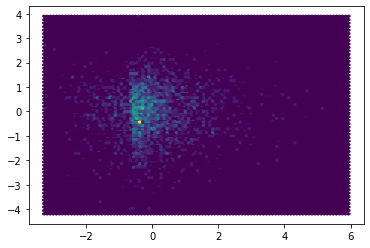

In [ ]:
plt.hexbin(X_test[:,0], X_test[:,1])

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:114: UserWarning:

Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.



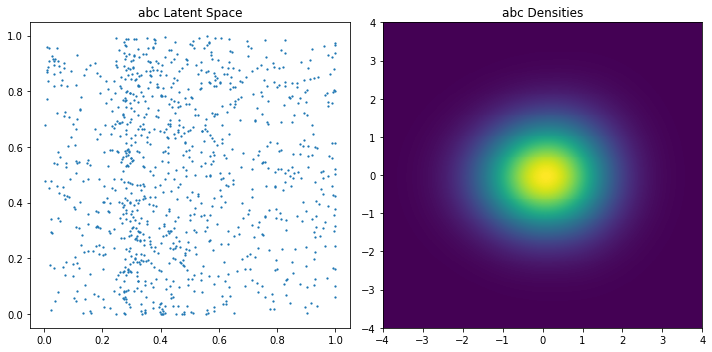

In [ ]:
model = AutoregressiveFlow(train_loader)

model.plot(title='abc')

In [ ]:
# applies gradient steps for each mini-batch in an epoch
def train(model, train_loader, optimizer):
    model.train()
    for x in train_loader:
        x = x.float()
        loss = model.nll(x)
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

def eval_loss(model, data_loader):
    model.eval()
    total_loss = 0
    with torch.no_grad():
        for x in data_loader:
            x = x.float()
            loss = model.nll(x)
            total_loss += loss * x.shape[0]
        avg_loss = total_loss / len(data_loader.dataset)
    return avg_loss.item()

def train_epochs(model, train_loader, test_loader, train_args):
    # training parameters
    epochs, lr = train_args['epochs'], train_args['lr']
    optimizer = optim.Adam(model.parameters(), lr=lr)

    # plotting parameters
    plot = train_args.get('plot', True)
    plot_frequency = train_args.get('plot_frequency', 5)
    if 'epochs_to_plot' in train_args.keys():
        plot_frequency = epochs + 1
        epochs_to_plot = train_args['epochs_to_plot']
    else:
        epochs_to_plot = []

    train_losses, test_losses = [], []
    for epoch in tqdm_notebook(range(epochs), desc='Epoch', leave=False):
        model.train()
        train(model, train_loader, optimizer)
        train_loss = eval_loss(model, train_loader)
        train_losses.append(train_loss)

        if test_loader is not None:
            test_loss = eval_loss(model, test_loader)
            test_losses.append(test_loss)

        if plot and (epoch % plot_frequency == 0 or epoch in epochs_to_plot):
            model.plot(f'Epoch {epoch}')
            
    if plot:
        plot_train_curves(epochs, train_losses, test_losses, title='Training Curve')
    return train_losses, test_losses

def plot_train_curves(epochs, train_losses, test_losses, title=''):
    x = np.linspace(0, epochs, len(train_losses))
    plt.figure()
    plt.plot(x, train_losses, label='train_loss')
    if test_losses:
        plt.plot(x, test_losses, label='test_loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.title(title)
    plt.legend()
    plt.show()

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:37: TqdmDeprecationWarning:

This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`



/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:114: UserWarning:

Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.



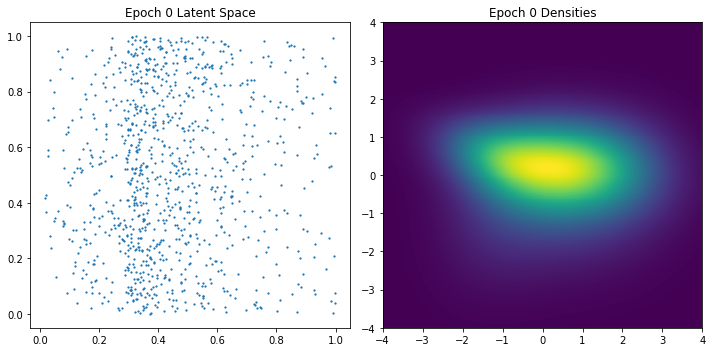

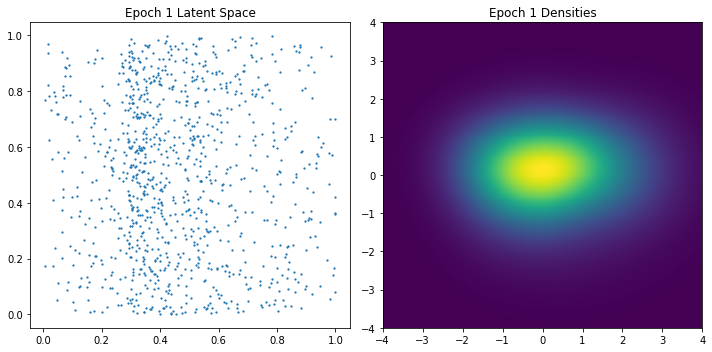

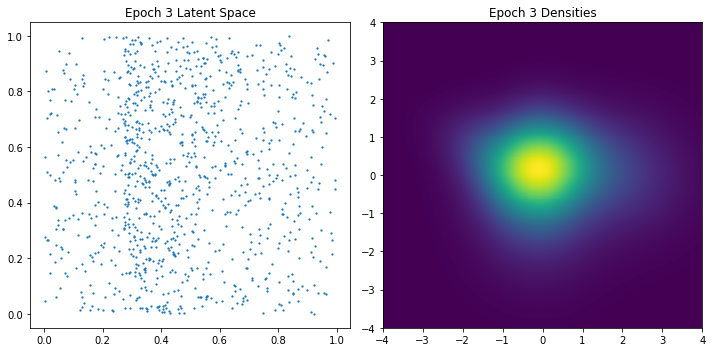

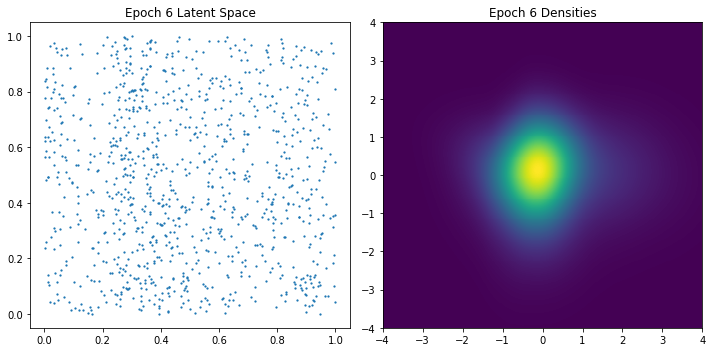

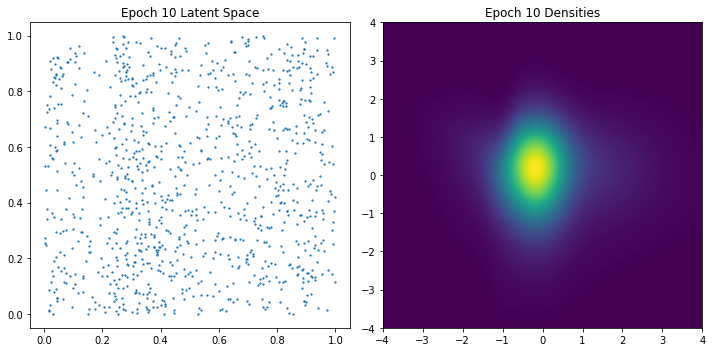

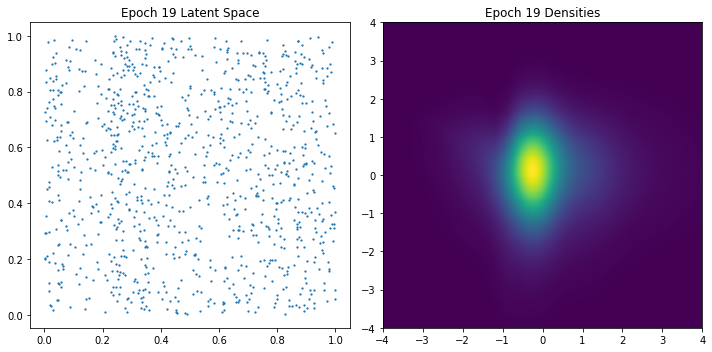

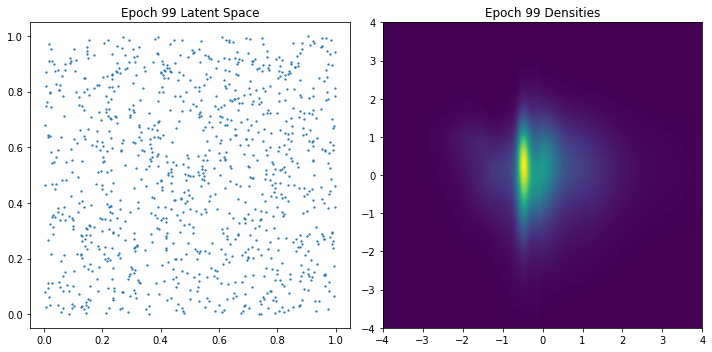

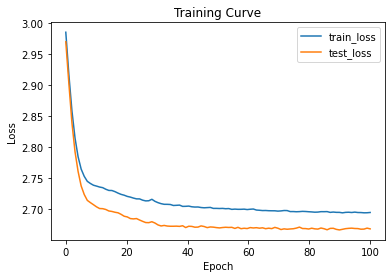

In [ ]:
import torch.optim as optim
from tqdm import trange, tqdm_notebook
model = AutoregressiveFlow(train_loader)
train_losses, test_losses = train_epochs(model, train_loader, test_loader,
                                         dict(epochs=100, 
                                              lr=1e-2, 
                                              epochs_to_plot=[0, 1, 3, 6, 10, 19,99]))



(-4.0, 4.0)

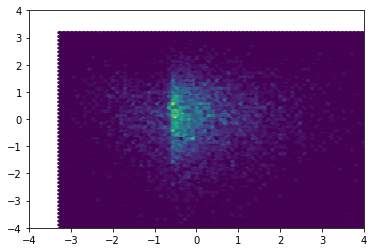

In [ ]:
plt.hexbin(X_train[:,0], X_train[:,1])
plt.ylim(-4,4)
plt.xlim(-4,4)

# [RealNVP/ Flow Model](https://deepgenerativemodels.github.io/notes/flow/)
**Real Non-Volume Preserving Model**
- additive coupling layers
- rescaling layers

Forward Mapping $z\rightarrow x$
1. $x_1 = z_1$ which is identity mapping
2. $x_2 = z_2$ + $m_\theta(z_1)$ where $m_\theta$ is a neural network

Inverse Mapping $x\rightarrow z$
1. $z_1 = x_1$
2. $z_2 = x_2 - m_\theta(x_1)$

The jacobian mapping is lower triangular, and the determinant is the product of the element on the diagonal which is $1 \rightarrow$ **volume preserving!!**

In RealNVP, there is an scaling factor to the transformation
$x_2 = exp(s_\theta(z_1)) z_2 + m_\theta(z_1)$
which results in a non-volume preserving transformation.

In [ ]:
class AffineTransform(nn.Module):
  def __init__(self, nvar, dims, mask_type='A'):
    super(AffineTransform, self).__init__()
    self.mask = self.build_mask(nvar, dims, mask_type)
    self.scale = nn.Parameter(torch.zeros(1), requires_grad=True)
    self.scale_shift = nn.Parameter(torch.zeros(1), requires_grad=True)

    n_hidden = 2
    hidden_size=64
    self.mlp = MLP(dims, n_hidden, hidden_size, 2* dims)

  def build_mask(self, nvar, dims, mask_type):
    if mask_type == 'A':
      mask = np.zeros(dims)
      mask[:nvar] = 1
      return torch.tensor(mask.astype('float32'))
    elif mask_type == 'B':
      mask = np.zeros(dims)
      mask[-nvar:] = 1
      return torch.tensor(mask.astype('float32'))      

  def forward(self, x, reverse=False):
    batch_size, dims = x.shape
    mask = self.mask.repeat(batch_size,1)
    x_ = x*mask

    log_s, t = self.mlp(x_).split(dims, dim=1)
    log_s = self.scale* torch.tanh(log_s) + self.scale_shift

    t = t * (1.0 - mask)
    log_s = log_s * (1.0 - mask)

    if reverse:  # inverting the transformation
        x = (x - t) * torch.exp(-log_s)
    else:
        x = x * torch.exp(log_s) + t
    return x, log_s


class ActNorm(nn.Module):
  def __init__(self, n_channels):
    super(ActNorm, self).__init__()
    self.log_scale = nn.Parameter(torch.zeros(1, n_channels), requires_grad=True)
    self.shift = nn.Parameter(torch.zeros(1, n_channels), requires_grad=True)
    self.n_channels = n_channels
    self.initialized = False

  def forward(self, x, reverse=False):
    if reverse:
      return (x - self.shift) * torch.exp(-self.log_scale), self.log_scale
    else:
      if not self.initialized:
        self.shift.data = -torch.mean(x, dim=0, keepdim=True)
        self.log_scale.data = - torch.log(torch.std(x, dim=0).reshape(1, self.n_channels))
        self.initialized = True
      result = x * torch.exp(self.log_scale) + self.shift
      return x * torch.exp(self.log_scale) + self.shift, self.log_scale

In [ ]:
class RealNVP(nn.Module):
  def __init__(self, dims):
    super(RealNVP, self).__init__()
    self.prior = torch.distributions.Normal(torch.tensor(0.), torch.tensor(1.))
    self.flow = nn.ModuleList([
                               AffineTransform(dims//2, dims, 'A'),
                               AffineTransform(dims//2, dims, 'B'),
                               AffineTransform(dims//2, dims, 'A'),
                               AffineTransform(dims//2, dims, 'B'), 
                               AffineTransform(dims//2, dims, 'A'),
                               AffineTransform(dims//2, dims, 'B'), 
                               ])
    self.dims = dims

  def g(self, z):
    # z -> x (inverse of f)
    for op in reversed(self.flow):
      z, _ = op.forward(z, reverse=True)
    return z

  def f(self, x):
    # maps x-> z, and returns the log determinant (not reduced)
    z, log_det = x, torch.zeros_like(x)
    for op in self.flow:
      z, delta_log_det = op.forward(z)
      log_det += delta_log_det
    return z, log_det

  def log_prob(self, x):
    z, log_det = self.f(x)
    return torch.sum(self.prior.log_prob(z), dim=-1) + torch.sum(log_det, dim=-1)

  def sample(self, num_samples):
    z = self.prior.sample([num_samples, self.dims])
    return self.g(z)

In [ ]:
import time
from tqdm.notebook import tqdm, trange

class RealNVPTrainer(object):
  def __init__(self, features_column=None, learning_rate=2e-4, n_epochs=1000):

    if features_column is None:
      # halo_dmvir_dt_inst
      # we have dropped this, because there is negative values...
      features_column  = ['halo_macc', 'halo_spin',
                          'halo_scale_factor_firstacc', 'halo_c_to_a', 'halo_mvir_firstacc',
                          'halo_scale_factor_last_mm', 'halo_scale_factor_mpeak', 'halo_m500c',
                          'halo_halfmass_scale_factor', 'halo_rvir', 'halo_vpeak', 'halo_mpeak',
                          'halo_m_pe_diemer', 'halo_m2500c', 'halo_mvir', 'halo_voff',
                          'halo_b_to_a', 'halo_m200b', 'halo_vacc', 'halo_scale_factor_lastacc',
                          'halo_m200c', 'halo_rs', 'halo_nfw_conc',
                          'halo_mvir_host_halo']
      
              
    self.features_column = features_column
    self.dims = len(features_column)
    self.train_loader, self.val_loader = self.create_loaders()
    self.log_interval = 100
    self.n_epochs = n_epochs
    self.learning_rate = learning_rate
    self.n_batches_in_epoch = len(self.train_loader)


  def build(self):
    self.flow = RealNVP(self.dims)
    self.optimizer = torch.optim.Adam(self.flow.parameters(), lr=self.learning_rate)

  def create_loaders(self, sample_size =100000, dataframe=df_halos, batch_size=1024):
    # should absorb the above code and wrap it here
    # features_column = ['halo_spin', 'halo_m500c', 'halo_rvir', 
    #                   'halo_mvir', 'halo_vacc', 'halo_vmax']


    self.scaler = StandardScaler()
    df_train = self.scaler.fit_transform( 
        np.log10(dataframe[self.features_column].sample(sample_size)+1e-6)).astype('float')

    X_train, X_test = train_test_split(df_train, random_state =42)
    train_loader = DataLoader(X_train, batch_size=batch_size, shuffle=True)
    test_loader  = DataLoader(X_test,  batch_size=batch_size, shuffle=True)
    return train_loader, test_loader

  def train(self):
    train_losses = []
    val_losses = []
    for epoch_i in trange(self.n_epochs, desc='epoch', position=0):
      epoch_i += 1

      self.flow.train()
      self.batch_loss_history = []
      for batch_i, x in enumerate(tqdm(self.train_loader, desc='Batch', 
                                       leave=False, position=1)):

        batch_i += 1
        log_prob = self.flow.log_prob(x.float())
        batch_loss = -torch.mean(log_prob) / self.dims

        self.optimizer.zero_grad()
        batch_loss.backward()
        self.optimizer.step()

        batch_loss = float(batch_loss.data)
        self.batch_loss_history.append(batch_loss)

      epoch_loss = np.mean(self.batch_loss_history)

      if epoch_i % 10 == 0:
        tqdm.write(f'Epoch {epoch_i} Loss: {epoch_loss:.2f}')


      train_losses.append(epoch_loss)
      val_losses.append(self.get_loss(self.val_loader))

    return train_losses, val_losses


  def get_loss(self, loader):
    """Compute error on provided data set"""
    errors = []
    start = time.time()

    self.flow.eval()

    for x in loader:
      with torch.no_grad():
        log_prob = self.flow.log_prob(x.float())

        loss = -torch.mean(log_prob) / self.dims
        error = float(loss.data)
        errors.append(error)

    time_test = time.time() - start
    # log_string = f'Calc done! | It took {time_test:.1f}s | '
    # log_string += f'Loss: {np.mean(errors):.2f}'
    # tqdm.write(log_string)
    return np.mean(errors)

In [ ]:
model_trainer = RealNVPTrainer()
model_trainer.build()

In [ ]:
train, val = model_trainer.train()

Epoch 10 Loss: 0.21


Epoch 20 Loss: -0.26


Epoch 30 Loss: -0.40


Epoch 40 Loss: -0.49


Epoch 50 Loss: -0.55


Epoch 60 Loss: -0.60


Epoch 70 Loss: -0.64


Epoch 80 Loss: -0.68


Epoch 90 Loss: -0.72


Epoch 100 Loss: -0.74


Epoch 110 Loss: -0.77


Epoch 120 Loss: -0.78


Epoch 130 Loss: -0.80


Epoch 140 Loss: -0.82


Epoch 150 Loss: -0.84


Epoch 160 Loss: -0.85


Epoch 170 Loss: -0.87


Epoch 180 Loss: -0.88


Epoch 190 Loss: -0.89


Epoch 200 Loss: -0.90


Epoch 210 Loss: -0.91


Epoch 220 Loss: -0.93


Epoch 230 Loss: -0.94


Epoch 240 Loss: -0.95


Epoch 250 Loss: -0.95


Epoch 260 Loss: -0.96


Epoch 270 Loss: -0.97


Epoch 280 Loss: -0.98


Epoch 290 Loss: -0.98


Epoch 300 Loss: -1.00


Epoch 310 Loss: -1.00


Epoch 320 Loss: -1.01


Epoch 330 Loss: -1.02


Epoch 340 Loss: -1.02


Epoch 350 Loss: -1.02


Epoch 360 Loss: -1.04


Epoch 370 Loss: -1.04


Epoch 380 Loss: -1.04


Epoch 390 Loss: -1.03


Epoch 400 Loss: -1.06


Epoch 410 Loss: -1.06


Epoch 420 Loss: -1.07


Epoch 430 Loss: -1.08


Epoch 440 Loss: -1.07


Epoch 450 Loss: -1.08


Epoch 460 Loss: -1.09


Epoch 470 Loss: -1.08


Epoch 480 Loss: -1.09


Epoch 490 Loss: -1.11


Epoch 500 Loss: -1.10


Epoch 510 Loss: -1.10


Epoch 520 Loss: -1.11


Epoch 530 Loss: -1.12


Epoch 540 Loss: -1.12


Epoch 550 Loss: -1.13


Epoch 560 Loss: -1.13


Epoch 570 Loss: -1.15


Epoch 580 Loss: -1.14


Epoch 590 Loss: -1.15


Epoch 600 Loss: -1.14


Epoch 610 Loss: -1.14


Epoch 620 Loss: -1.14


Epoch 630 Loss: -1.17


Epoch 640 Loss: -1.15


Epoch 650 Loss: -1.16


Epoch 660 Loss: -1.17


Epoch 670 Loss: -1.17


Epoch 680 Loss: -1.15


Epoch 690 Loss: -1.17


Epoch 700 Loss: -1.17


Epoch 710 Loss: -1.18


Epoch 720 Loss: -1.19


Epoch 730 Loss: -1.19


Epoch 740 Loss: -1.19


Epoch 750 Loss: -1.18


Epoch 760 Loss: -1.19


Epoch 770 Loss: -1.20


Epoch 780 Loss: -1.18


Epoch 790 Loss: -1.21


Epoch 800 Loss: -1.21


Epoch 810 Loss: -1.21


Epoch 820 Loss: -1.21


Epoch 830 Loss: -1.22


Epoch 840 Loss: -1.22


Epoch 850 Loss: -1.22


Epoch 860 Loss: -1.22


Epoch 870 Loss: -1.22


Epoch 880 Loss: -1.23


Epoch 890 Loss: -1.19


Epoch 900 Loss: -1.22


Epoch 910 Loss: -1.22


Epoch 920 Loss: -1.24


Epoch 930 Loss: -1.23


Epoch 940 Loss: -1.23


Epoch 950 Loss: -1.24


Epoch 960 Loss: -1.23


Epoch 970 Loss: -1.24


Epoch 980 Loss: -1.24


Epoch 990 Loss: -1.23


Epoch 1000 Loss: -1.25



# conditional probability estimate
-https://github.com/mackelab/pyknos


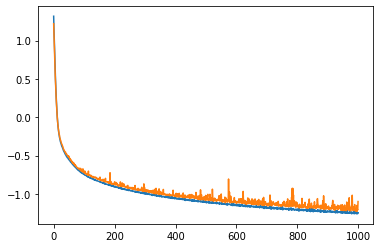

In [ ]:
plt.plot(train)
plt.plot(val)

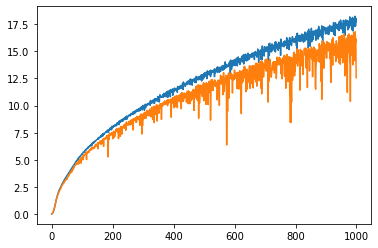

In [ ]:
plt.plot( 10**-np.array(train))
plt.plot( 10**-np.array(val))

In [ ]:
xxx = model_trainer.flow.sample(100)

In [ ]:
probx = model_trainer.flow.log_prob(xxx)

(array([ 1.,  7.,  8.,  7., 10., 10.,  3., 16., 30.,  8.]),
 array([-0.30007553,  4.465522  ,  9.231119  , 13.996716  , 18.762314  ,
        23.52791   , 28.293507  , 33.059105  , 37.824703  , 42.590298  ,
        47.355896  ], dtype=float32),
 <a list of 10 Patch objects>)

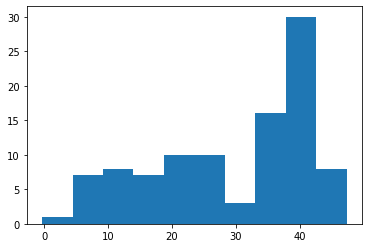

In [ ]:
plt.hist(probx.detach().cpu().numpy())

In [ ]:
model_trainer.flow.flow[0].scale, model_trainer.flow.flow[0].scale_shift

(Parameter containing:
 tensor([-0.6464], requires_grad=True), Parameter containing:
 tensor([0.3639], requires_grad=True))

In [ ]:
model_trainer.flow.flow[1].scale, model_trainer.flow.flow[1].scale_shift

(Parameter containing:
 tensor([0.7373], requires_grad=True), Parameter containing:
 tensor([0.4200], requires_grad=True))

In [ ]:
xnumpy = model_trainer.scaler.inverse_transform(xxx.detach().numpy())

In [ ]:
xxx = model_trainer.flow.sample(1024)

z, _ = model_trainer.flow.f(xxx)

In [ ]:
z = []
for t in model_trainer.train_loader:
  z.append(model_trainer.flow.f(t.float())[0])
z = torch.cat(z)

In [ ]:
z.mean(dim=0), z.std(dim=0)

(tensor([-0.3504,  0.8264, -0.0183,  0.9829, -0.7618, -0.6851,  0.3108, -0.4293,
         -0.4752, -0.5314,  0.5883, -0.0323,  0.2093,  0.0619,  0.1725,  0.1267,
          0.0738,  0.1524,  0.0316,  0.0244,  0.0290,  0.2368, -0.2331, -0.0114],
        grad_fn=<MeanBackward1>),
 tensor([1.0626, 1.1235, 0.8885, 0.9362, 1.0338, 0.9216, 0.8972, 1.0389, 0.8682,
         0.9812, 0.8685, 1.0141, 1.0338, 0.9648, 0.9999, 1.0140, 0.9590, 1.0264,
         0.9976, 0.8953, 1.0211, 1.0400, 1.0425, 0.8156],
        grad_fn=<StdBackward1>))

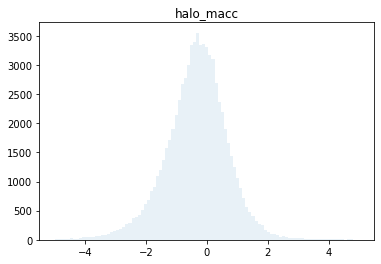

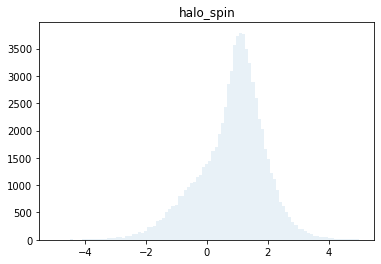

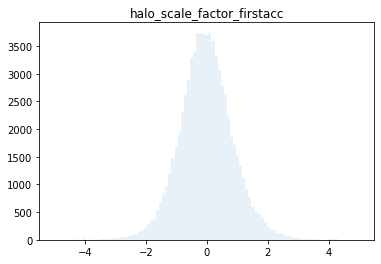

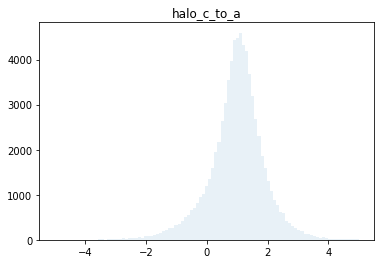

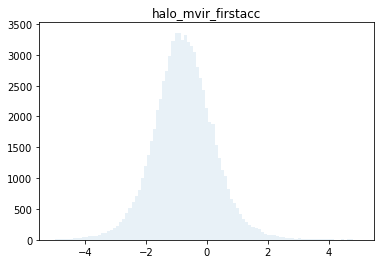

...

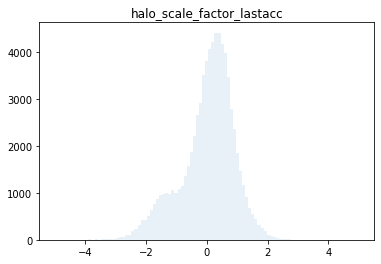

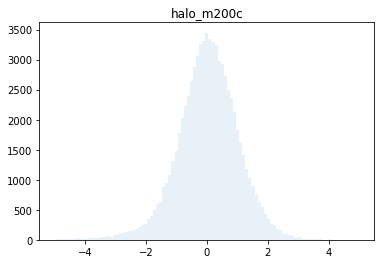

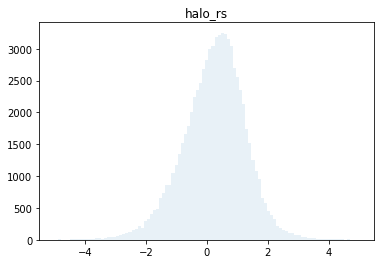

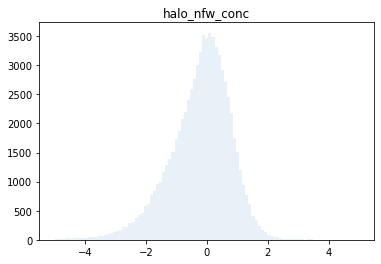

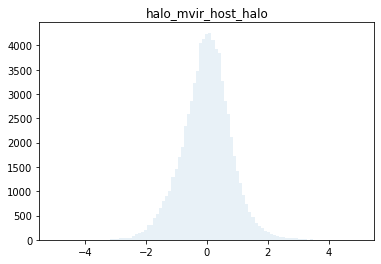

In [ ]:
for i in range(z.shape[1]):
  plt.hist(z[:,i].detach().numpy(), alpha=0.1, bins=np.linspace(-5,5,100))
  plt.title(model_trainer.features_column[i])
  plt.show()

In [ ]:
xxxnumpy = 10.0**model_trainer.scaler.inverse_transform(xxx.detach().numpy())
dd = pd.DataFrame(xxxnumpy, columns=model_trainer.features_column)

In [ ]:
dd[['halo_spin', 'halo_scale_factor_firstacc', 'halo_c_to_a']]

,halo_spin,halo_scale_factor_firstacc,halo_c_to_a
0,0.053693,0.999556,0.727138
1,0.231921,1.000997,0.322679
2,0.060297,0.998692,0.902549
3,0.088051,0.998758,0.621071
4,0.032077,1.000510,0.676934
...,...,...,...
1019,0.039230,0.965533,0.158753
1020,0.115580,0.999150,0.453142
1021,0.040458,0.998636,0.687059
1022,0.007562,0.984194,0.435987


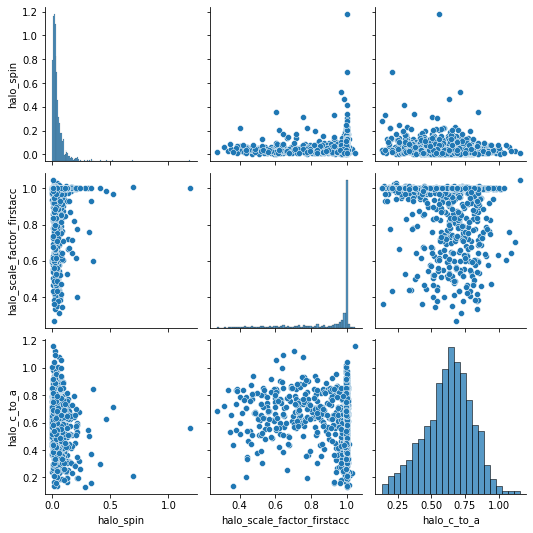

In [ ]:
import seaborn  as sns
sns.pairplot(dd, vars=['halo_spin', 'halo_scale_factor_firstacc', 'halo_c_to_a'])

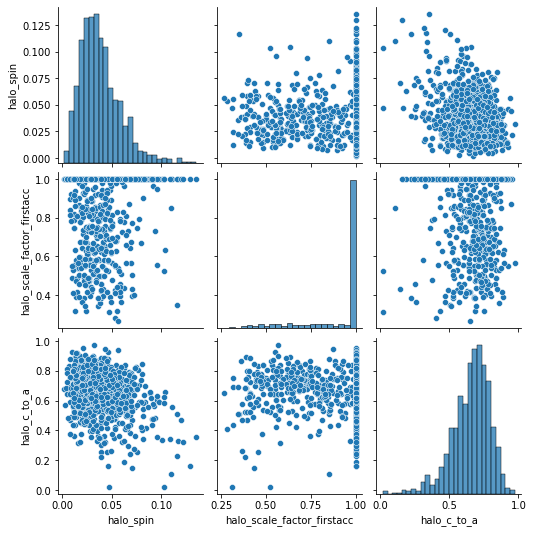

In [ ]:
sns.pairplot(df_halos.sample(1000), 
             vars=['halo_spin', 'halo_scale_factor_firstacc', 'halo_c_to_a'])


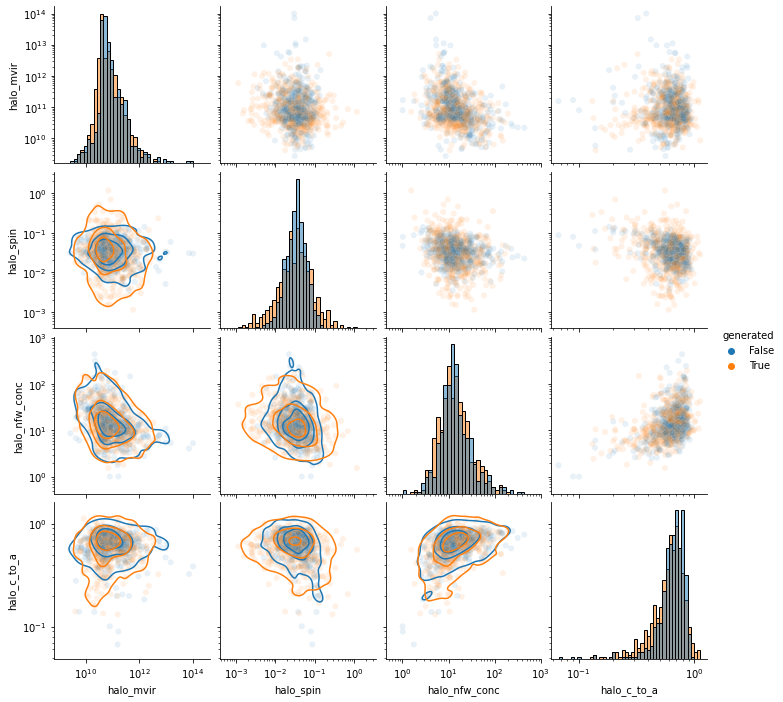

In [ ]:
xxxnumpy = 10.0**model_trainer.scaler.inverse_transform(xxx.detach().numpy())
dd = pd.DataFrame(xxxnumpy, columns=model_trainer.features_column)


# prepare the dataframe for pairplot
tmp = dd.copy()
tmp['generated'] = True
tmp2 = df_halos.sample(1024).copy()
tmp2['generated'] = False
tmp = tmp.append(tmp2)


tmp = tmp.dropna(axis=1)
c = [i for i in tmp.columns if i != 'generated']
tmp = tmp[((tmp[c]>0).sum(axis=1)== len(c))]

newcols = np.random.choice(tmp.columns,size=4, replace=False)
newcols = ['halo_mvir', 'halo_spin', "halo_nfw_conc", 'halo_c_to_a']


ax = sns.pairplot(tmp.sample(1024), vars=newcols,
              hue='generated', plot_kws={'alpha': 0.1}, kind='scatter', diag_kind='off')

ax.set(xscale="log", yscale="log")
# Set the scale of the x-and y-axes
ax.map_lower(sns.kdeplot, levels=4)
ax.map_diag(sns.histplot)

# for a in ax.diag_axes:
#   a.set_yscale('linear')

In [ ]:
eval_model = model_trainer.flow.eval()
eval_model.g(torch.randn(10, len(model_trainer.features_column)))

# TODO: given a few parameter, do gradient ascent to find the most probable rest of the parameters
- say given a halo mass, and spin, what is the probability distribution of their major merge redshift ... halo c to a


# seqeunce modelling
- given 3 halos, we can come up with some unique rotationally invariant description of 
1. groupby host haloes
2. sort the sequence by the halo mass

\begin{align*}
z_{h_i} &= f_\theta(h_i) \\
z_{h_{i+1}} &=\textrm{RNN/Transformer} (z_{h_{i+1}} | z_{h_1}, z_{h_2}, ... z_{h_i})
\end{align*}

- use the flow model to somehow encode the halo information to a latent vector z which can be drawn conveniently from bunch of gaussians
- 

In [ ]:
count_hosthalo = df_halos['halo_hostid'].value_counts()
halo_idx = count_hosthalo[(count_hosthalo > 2)].index

In [ ]:
halo_idx

Int64Index([3061174745, 3058789213, 3065537060, 3065375621, 3070308560,
            3066721780, 3063388276, 3061193734, 3067868757, 3061362033,
            ...
            3066444454, 3069431552, 3067523114, 3058996507, 3061517853,
            3063618660, 3058465434, 3071371094, 3070299055, 3063558547],
           dtype='int64', length=39729)

In [ ]:
%%time
list_of_halos = []
count = 0
for idx in halo_idx:
  list_of_halos.append( df_halos[df_halos['halo_hostid'] == idx])

CPU times: user 1min 58s, sys: 2.84 s, total: 2min
Wall time: 1min 26s


In [ ]:
df_train = model_trainer.scaler.transform( 
    np.log10(list_of_halos[3][model_trainer.features_column].sort_values("halo_mvir", ascending=False)+1e-6))

In [ ]:
class simple_gru(nn.Module):
  def __init__(self):
    super(simple_gru, self).__init__()
    self.hidden_gru = 64
    self.input_size = 23
    self.gru1 = nn.GRU(self.input_size, self.hidden_gru,2)
    
    self.hidden_mlp = 128
    self.n_hidden_mlp = 2
    self.mlp  = MLP(self.hidden_gru, self.n_hidden_mlp, 
                    self.hidden_mlp, self.input_size )
    

  def forward(self, input):
    output, hidden = self.gru1(input)
    outhalos = self.mlp(output.squeeze(1))
    return outhalos

In [ ]:
gru_model = simple_gru()
gru_optimizer = optim.Adam(gru_model.parameters(), lr=1.0e-3)
all_loss = []
loss_fn = nn.MSELoss()

In [ ]:
# weak training signal, when the difference is large
# they are 1 anyways...
def sMAPE(output, target):
  loss = ((output - target).abs() / (output.abs()+target.abs())).mean()
  return loss

In [ ]:
for i in range(1000):
  gru_optimizer.zero_grad()
  output = gru_model(input_halos)
  loss = loss_fn(output[:-1], input_halos[1:].squeeze(1))
  loss.backward()
  gru_optimizer.step()
  all_loss.append(loss.item())

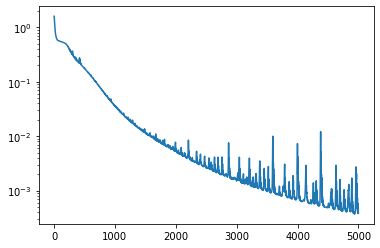

In [ ]:
plt.semilogy(all_loss)

In [ ]:
diff = ((input_halos[1:].squeeze(1) - output[:-1]) /input_halos[1:].squeeze(1) ).detach().numpy()

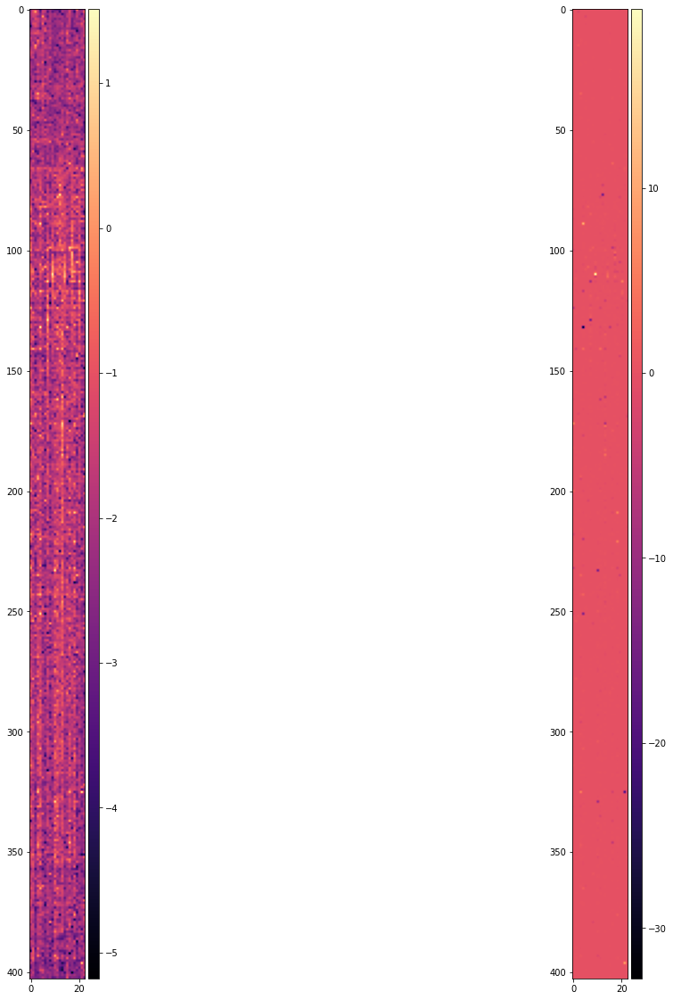

In [ ]:
from mpl_toolkits.axes_grid1 import make_axes_locatable
from matplotlib.colors import LogNorm
from matplotlib.ticker import MultipleLocator

f, (ax0, ax1) = plt.subplots(1,2, figsize=(20,20))
img1 = ax0.imshow( np.log10(np.abs(diff)),cmap='magma')
# Create divider for existing axes instance
divider0 = make_axes_locatable(ax0)
# Append axes to the right of ax3, with 20% width of ax3
cax0 = divider0.append_axes("right", size="20%", pad=0.05)
# Create colorbar in the appended axes
# Tick locations can be set with the kwarg `ticks`
# and the format of the ticklabels with kwarg `format`
cbar0 = plt.colorbar(img1, cax=cax0) #, ticks=MultipleLocator(0.2), format="%.2f")


img2 = ax1.imshow( diff, cmap='magma')
# Create divider for existing axes instance
divider1 = make_axes_locatable(ax1)
# Append axes to the right of ax3, with 20% width of ax3
cax1 = divider1.append_axes("right", size="20%", pad=0.05)
# Create colorbar in the appended axes
# Tick locations can be set with the kwarg `ticks`
# and the format of the ticklabels with kwarg `format`
cbar2 = plt.colorbar(img2, cax=cax1) #, ticks=MultipleLocator(0.2), format="%.2f")

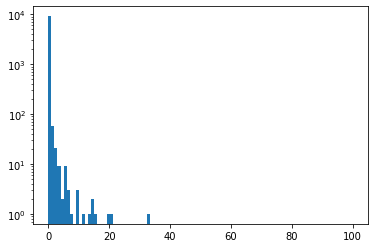

In [ ]:
plt.hist(np.abs(diff).flatten(), bins=np.linspace(0,100,100))
plt.yscale('log')
# plt.xscale('log')

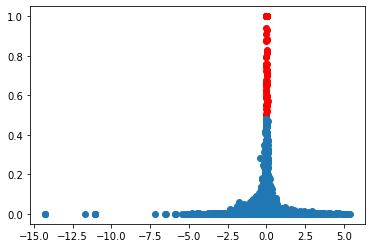

In [ ]:
smape = ((input_halos[1:].squeeze(1) - output[:-1]).abs() / (( input_halos[1:].squeeze(1) ).abs() + output[:-1].abs())).detach().numpy()
truth = input_halos[1:].squeeze(1).detach().numpy()

terrible = np.abs(smape) > 0.5

plt.scatter(truth[terrible], smape[terrible], color='r' )
plt.scatter(truth[~terrible], smape[~terrible] )
# plt.xlim(-0.1,0.1)
# plt.ylim(-10,10)

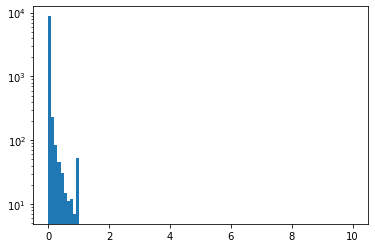

In [ ]:
plt.hist(np.abs(smape.flatten()),bins=np.linspace(0,10,100))
plt.yscale('log')

In [ ]:
pred =  output[:-1].detach().numpy()

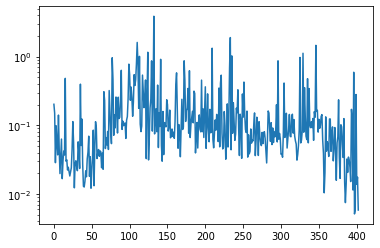

In [ ]:
plt.plot(np.abs((truth-pred)/truth).mean(axis=-1))
plt.yscale('log')

In [ ]:
from sklearn.neighbors import NearestNeighbors
import numpy as np
X = np.array([[-1, -1], [-2, -1], [-3, -2], [1, 1], [2, 1], [3, 2]])
nbrs = NearestNeighbors(n_neighbors=2, algorithm='ball_tree').fit(X)

In [ ]:
list_of_halos[2]

,halo_vmax_firstacc,halo_dmvir_dt_tdyn,halo_macc,halo_scale_factor,halo_vmax_mpeak,halo_m_pe_behroozi,halo_xoff,halo_spin,halo_scale_factor_firstacc,halo_c_to_a,halo_mvir_firstacc,halo_scale_factor_last_mm,halo_scale_factor_mpeak,halo_pid,halo_m500c,halo_id,halo_halfmass_scale_factor,halo_upid,halo_t_by_u,halo_rvir,halo_vpeak,halo_dmvir_dt_100myr,halo_mpeak,halo_m_pe_diemer,halo_jx,halo_jy,halo_jz,halo_m2500c,halo_mvir,halo_voff,halo_axisA_z,halo_axisA_x,halo_axisA_y,halo_y,halo_b_to_a,halo_x,halo_z,halo_m200b,halo_vacc,halo_scale_factor_lastacc,halo_vmax,halo_m200c,halo_vx,halo_vy,halo_vz,halo_dmvir_dt_inst,halo_rs,halo_nfw_conc,halo_hostid,halo_mvir_host_halo
632025,1246.540039,263000.000000,5.525000e+14,1.00035,1246.540039,5.732000e+14,0.117822,0.02987,1.000,0.26319,5.525000e+14,0.9253,1.0000,-1,2.455900e+14,3065537060,0.9163,-1,0.6904,1.698164,1262.859985,18050.000000,5.525000e+14,5.793000e+14,5.427000e+16,-2.776000e+16,3.247000e+15,5.793000e+13,5.525000e+14,586.059998,34.515301,61.659302,135.494995,64.915810,0.33084,140.122772,118.964104,6.141500e+14,1246.540039,1.000,1246.540039,4.446200e+14,-132.100006,-401.410004,-33.860001,11920.000000,0.464111,3.658961,3065537060,5.525000e+14
632030,362.929993,46170.000000,7.470000e+12,1.00035,690.530029,9.543000e+13,0.038195,0.01362,0.640,0.49440,7.470000e+12,0.4983,1.0000,3065537060,4.833800e+13,3065537066,0.9254,3065537060,0.8816,0.943122,690.530029,118600.000000,9.465000e+13,9.169000e+13,1.408000e+15,-1.818000e+15,1.014000e+14,1.618900e+13,9.465000e+13,25.540001,22.283899,35.893600,37.001099,64.665894,0.53003,140.002670,118.821907,1.118000e+14,362.929993,0.640,690.530029,7.254400e+13,524.770020,642.330017,481.239990,152100.000000,0.224768,4.195980,3065537060,5.525000e+14
632049,574.260010,-2323.000000,3.817000e+13,1.00035,550.650024,4.732000e+13,0.066443,0.02175,0.874,0.69457,3.715000e+13,0.6463,0.9314,3065537060,2.494400e+13,3065536991,0.4803,3065537060,0.9580,0.664843,628.349976,4353.000000,4.596000e+13,1.493000e+13,-4.083000e+13,-4.431000e+14,7.527000e+14,1.586300e+13,3.316000e+13,68.279999,-10.565600,8.256390,28.824400,65.779320,0.87754,140.414413,119.286613,3.600200e+13,569.590027,0.883,628.349976,2.946500e+13,-197.949997,923.659973,1408.699951,7392.000000,0.040970,16.227556,3065537060,5.525000e+14
632089,394.230011,354.100006,1.222000e+13,1.00035,398.660004,1.411000e+13,0.025889,0.01643,0.847,0.74415,1.163000e+13,0.3303,0.9973,3065537060,8.163500e+12,3065535533,0.4023,3065537060,0.6990,0.480491,442.369995,405.200012,1.268000e+13,7.259000e+12,-4.878000e+13,4.551000e+11,2.370000e+13,4.070500e+12,1.252000e+13,35.049999,-11.213500,16.475700,16.204800,64.059433,0.84751,139.155319,118.743393,1.378400e+13,394.260010,0.982,398.619995,1.057100e+13,1222.900024,1331.619995,-365.730011,-3815.000000,0.051922,9.254092,3065537060,5.525000e+14
632175,340.010010,-149.000000,5.583000e+12,1.00035,340.739990,7.252000e+12,0.005259,0.05447,0.928,0.71096,5.583000e+12,0.7543,0.7964,3065536991,4.058400e+12,3065536502,0.3903,3065537060,0.6200,0.360747,364.910004,-1017.000000,5.773000e+12,2.184000e+12,-1.231000e+13,-3.006000e+13,-1.092000e+13,2.376500e+12,5.297000e+12,16.379999,-7.809800,-7.652630,11.784500,65.936981,0.85597,140.565643,118.773911,5.564300e+12,340.010010,0.928,337.679993,4.843500e+12,142.369995,-1984.479980,466.380005,-977.700012,0.021301,16.935682,3065537060,5.525000e+14
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
646581,71.010002,-0.340400,2.549000e+10,1.00035,83.769997,2.708000e+09,0.006017,0.01979,0.312,0.33304,1.690000e+10,0.1563,0.3963,3065537060,8.177800e+08,3065528055,0.3784,3065537060,0.8132,0.028419,83.769997,-0.190300,6.665000e+10,2.044000e+09,-7.699000e+07,-1.140000e+07,1.296000e+07,0.000000e+00,2.590000e+09,0.690000,5.857690,0.213010,-3.242470,65.883171,0.88705,140.002594,118.414352,2.589600e+09,66.650002,0.550,20.

In [ ]:
from torch.nn.utils.rnn import pad_sequence

In [ ]:
tmp = list_of_halos[3].sort_values('halo_mvir')[model_trainer.features_column]


In [ ]:
# input_size – The number of expected features in the input x

# hidden_size – The number of features in the hidden state h

# num_layers – Number of recurrent layers. E.g., setting num_layers=2 would mean stacking two GRUs together to form a stacked GRU, with the second GRU taking in outputs of the first GRU and computing the final results. Default: 1

# bias – If False, then the layer does not use bias weights b_ih and b_hh. Default: True

# batch_first – 

# dropout – If non-zero, introduces a Dropout layer on the outputs of each GRU layer except the last layer, with dropout probability equal to dropout. Default: 0

# bidirectional – If True, becomes a bidirectional GRU. Default: False


input_size = 24
hidden_size = 64
bias = True
dropout = 0.3
bidirectional = True

rnn = nn.GRU(input_size, hidden_size=64, 
             num_layers=2, dropout=0.3, 
              bidirectional=False)
# can be our flow



In [ ]:
h0 = torch.from_numpy(tmp.values).unsqueeze(1)
output, hn = rnn(h0)

In [ ]:
output.shape, hn.shape

(torch.Size([404, 1, 64]), torch.Size([2, 1, 64]))

In [ ]:
output.

torch.Size([404, 1, 64])

In [ ]:
# https://pytorch.org/tutorials/intermediate/seq2seq_translation_tutorial.html

class EncoderRNN(nn.Module):
    def __init__(self, input_size, hidden_size):
        super(EncoderRNN, self).__init__()
        self.hidden_size = hidden_size
        self.linear1 = nn.Linear(input_size, hidden_size)
        self.gru = nn.GRU(hidden_size, hidden_size)

    def forward(self, input, hidden):
        output = self.linear1(input)
        output, hidden = self.gru(output, hidden)
        return output, hidden

    def initHidden(self):
        return torch.zeros(1, 1, self.hidden_size)

class DecoderRNN(nn.Module):
    def __init__(self, hidden_size, output_size):
        super(DecoderRNN, self).__init__()
        self.hidden_size = hidden_size
        self.gru = nn.GRU(hidden_size, hidden_size)
        self.out = nn.Linear(hidden_size, output_size)
        self.softmax = nn.LogSoftmax(dim=1)

    def forward(self, input, hidden):
        output = self.embedding(input).view(1, 1, -1)
        output = F.relu(output)
        output, hidden = self.gru(output, hidden)
        output = self.softmax(self.out(output[0]))
        return output, hidden

    def initHidden(self):
        return torch.zeros(1, 1, self.hidden_size)


MAX_LENGTH = 128

class AttnDecoderRNN(nn.Module):
    def __init__(self, hidden_size, output_size, dropout_p=0.1, max_length=MAX_LENGTH):
        super(AttnDecoderRNN, self).__init__()
        self.hidden_size = hidden_size
        self.output_size = output_size
        self.dropout_p = dropout_p
        self.max_length = max_length


        self.attn = nn.Linear(self.hidden_size * 2, self.max_length)
        self.attn_combine = nn.Linear(self.hidden_size * 2, self.hidden_size)
        self.dropout = nn.Dropout(self.dropout_p)
        self.gru = nn.GRU(self.hidden_size, self.hidden_size)
        self.out = nn.Linear(self.hidden_size, self.output_size)

    def forward(self, input, hidden, encoder_outputs):
        embedded = input
        attn_weights = F.softmax(
            self.attn(torch.cat((embedded[0], hidden[0]), 1)), dim=1)
        print(attn_weights.shape, encoder_outputs.shape)
        
        attn_applied = torch.bmm(attn_weights.unsqueeze(0),
                                 encoder_outputs.unsqueeze(0))

        output = torch.cat((embedded[0], attn_applied[0]), 1)
        output = self.attn_combine(output).unsqueeze(0)

        output = F.relu(output)
        output, hidden = self.gru(output, hidden)

        output = F.log_softmax(self.out(output[0]), dim=1)
        return output, hidden, attn_weights

    def initHidden(self):
        return torch.zeros(1, 1, self.hidden_size)

In [ ]:
h0.shape, c0.shape

(torch.Size([404, 1, 24]), torch.Size([1, 1, 64]))

In [ ]:
hidden_size = 64
input_size  = 23
enc_rnn = EncoderRNN(input_size, hidden_size)
dec_rnn = AttnDecoderRNN(hidden_size, input_size)

In [ ]:
tmp = h0[(h0 > 0).sum(dim=-1) == 24]
tmp = tmp.log()[:,:-1]
hnorm = ((tmp - tmp.mean(dim=0)) / tmp.std(dim=0)).unsqueeze(1)

In [ ]:
decoder_input.view(1,1,-1).shape

torch.Size([1, 1, 64])

In [ ]:
c1 = dec_rnn.initHidden()
dec_rnn(h0, output, c1)

torch.Size([1, 128]) torch.Size([1, 1, 64])


RuntimeError: ignored

In [ ]:
for di in range(target_length):
    decoder_output, decoder_hidden, decoder_attention = decoder(
        decoder_input, decoder_hidden, encoder_outputs)
    loss += criterion(decoder_output, target_tensor[di])
    decoder_input = target_tensor[di]  # Teacher forcing

In [ ]:
teacher_forcing_ratio = 0.5


def train(input_tensor, target_tensor, encoder, decoder, encoder_optimizer, decoder_optimizer, criterion, max_length=MAX_LENGTH):
    encoder_hidden = encoder.initHidden()

    encoder_optimizer.zero_grad()
    decoder_optimizer.zero_grad()

    input_length = input_tensor.size(0)
    target_length = target_tensor.size(0)

    encoder_outputs = torch.zeros(max_length, encoder.hidden_size, device=device)

    loss = 0

    for ei in range(input_length):
        encoder_output, encoder_hidden = encoder(
            input_tensor[ei], encoder_hidden)
        encoder_outputs[ei] = encoder_output[0, 0]

    decoder_input = torch.tensor([[SOS_token]], device=device)

    decoder_hidden = encoder_hidden

    use_teacher_forcing = True if random.random() < teacher_forcing_ratio else False

    if use_teacher_forcing:
        # Teacher forcing: Feed the target as the next input
        for di in range(target_length):
            decoder_output, decoder_hidden, decoder_attention = decoder(
                decoder_input, decoder_hidden, encoder_outputs)
            loss += criterion(decoder_output, target_tensor[di])
            decoder_input = target_tensor[di]  # Teacher forcing

    else:
        # Without teacher forcing: use its own predictions as the next input
        for di in range(target_length):
            decoder_output, decoder_hidden, decoder_attention = decoder(
                decoder_input, decoder_hidden, encoder_outputs)
            topv, topi = decoder_output.topk(1)
            decoder_input = topi.squeeze().detach()  # detach from history as input

            loss += criterion(decoder_output, target_tensor[di])
            if decoder_input.item() == EOS_token:
                break

    loss.backward()

    encoder_optimizer.step()
    decoder_optimizer.step()

    return loss.item() / target_length

In [ ]:
features_column = ['halo_x', 'halo_y', 'halo_z', 'halo_spin', 'halo_m500c', 'halo_rvir', 
                   "halo_jx",	"halo_jy", "halo_jz", 'halo_mvir', 'halo_vacc', 'halo_vmax', 
                   "halo_vx",	"halo_vy", "halo_vz"]
all_halos_features = pd.DataFrame()

all_halos_features['halo_x'] = df_halos['halo_x']
all_halos_features['halo_y'] = df_halos['halo_y']
all_halos_features['halo_z'] = df_halos['halo_z']

all_halos_features['halo_vx'] = df_halos['halo_vx']
all_halos_features['halo_vy'] = df_halos['halo_vy']
all_halos_features['halo_vz'] = df_halos['halo_vz']

# all_halos_features['log_jx']  = np.log10(df_halos['halo_jx'])
# all_halos_features['log_jy']  = np.log10(df_halos['halo_jy'])
# all_halos_features['log_jz']  = np.log10(df_halos['halo_jz'])
all_halos_features["log_mvir"] = np.log10(df_halos['halo_mvir'])
all_halos_features["log_spin"] = np.log10(df_halos['halo_spin'])

# all_halos_features['log_rvir'] = np.log10(df_halos['halo_rvir'])
all_halos_features['log_vacc'] = np.log10(df_halos['halo_vacc'])
all_halos_features["log_vmax"] = np.log10(df_halos['halo_vmax'])

# all_halos_features['halo_hostid'] = df_halos['halo_hostid']
# all_halos_features['halo_id'] = df_halos['halo_id']

tmp = all_halos_features.replace([np.inf, -np.inf], np.nan).dropna()

from sklearn.preprocessing import StandardScaler
scalar = StandardScaler()
scalar.fit(tmp)

/usr/local/lib/python3.6/dist-packages/pandas/core/series.py:726: RuntimeWarning:

divide by zero encountered in log10



StandardScaler(copy=True, with_mean=True, with_std=True)

In [ ]:
def normalized_features(df, scalar=scalar, max_length=256):
  tmp = df.replace([np.inf, -np.inf], np.nan).dropna()
  tmp = tmp.sort_values('log_mvir', ascending=False).values
  tmp = scalar.transform(tmp)

  ref_pos_vel = tmp[0, :6]
  tmp[:, :6] -= ref_pos_vel
  tmp[:, :3] /= 1.0e-2
  # we 
  if max_length < len(tmp):
    return tmp[:max_length], np.ones(max_length)
  else:
    out = np.pad(tmp, ((0, max_length-len(tmp) ), (0,0)))
    mask = np.ones(max_length)
    mask[len(tmp):] = 0
    return out, mask

In [ ]:
normalized_input = []
mask_input       = []
hostid_input     = []

df_features_with_haloid = all_halos_features.copy()
cols = all_halos_features.columns
df_features_with_haloid['halo_hostid'] = df_halos['halo_hostid']

count = 0
for hostid, group in df_features_with_haloid.groupby('halo_hostid'):
  
  if len(group) >= 10:
    out, mask = normalized_features(group[cols])
    
    normalized_input.append(out)
    mask_input.append(mask)
    hostid_input.append(hostid)

In [ ]:
normalized_input = np.array(normalized_input)
mask_input = np.array(mask_input)

In [ ]:
import torch.nn as nn
class MLP(nn.Module):
  def __init__(self, input_shape, output_shape, hidden=32, n_hidden=2):
    super().__init__()
    project_in = nn.Sequential(
        nn.Linear(input_shape, hidden),
        nn.ReLU()
    )
    layers = [project_in]
    for n in range(n_hidden):
      layers.append(nn.Linear(hidden,hidden))
      layers.append(nn.ReLU())
    layers.append(
        nn.Sequential(
        nn.Linear(hidden, output_shape),
        nn.ReLU()
    )   
    )
    self.net = nn.Sequential(*layers)
  def forward(self, x):
    return self.net(x)


In [ ]:
# modified from transformer 
# we took away the positional embedding, token embedding
# just add a bunch of attention heads and see how thinks goes

# Embedding Layer
# original: self.token_emb = nn.Embedding(num_tokens, dim)
# encode the number of tokens into vectors of dimension `dim`

# instead dim == num of features for us
import torch.nn as nn
from x_transformers import Decoder



class HaloTransformer(nn.Module):
    def __init__(
        self,
        *,
        nfeatures,
        hidden,
        attn_layers,
        num_memory_tokens = 0,
        max_seq_len = 256
    ):
        super().__init__()
        dim = attn_layers.dim

        # sequence length is the length of chains of halos
        self.max_seq_len = max_seq_len
        self.attn_layers = attn_layers
        self.norm = nn.LayerNorm(dim)
        self.mlp_in  = MLP(nfeatures, hidden)
        self.mlp_out = MLP(hidden, nfeatures)
        self.sigmoid_out = nn.Sequential( 
            nn.Linear(hidden, 2),
            nn.Sigmoid()
         )

    def forward(self, x, mask = None, **kwargs):
        # b, n, device = *x.shape, x.device
        x = self.mlp_in(x)
        x = self.attn_layers(x, mask = mask, **kwargs)
        x = self.norm(x)
        out = self.mlp_out(x)
        eos = self.sigmoid_out(x)
        return out, eos

In [ ]:
import torch

NFEATURES = 10
HIDDEN    = 32

attn_layers = Decoder(
        dim = HIDDEN,
        depth = 12,
        heads = 8,
    )

ht = HaloTransformer( nfeatures=NFEATURES, hidden=HIDDEN, attn_layers=attn_layers)

out = ht(torch.from_numpy(normalized_input[:4]))

print(out[0].shape, out[1].shape)

torch.Size([4, 256, 10]) torch.Size([4, 256, 2])


In [ ]:
X1    = torch.from_numpy(normalized_input).to('cuda')
Mask1 = torch.from_numpy(mask_input).long().to('cuda')

In [ ]:
X1[:1]

tensor([[[ 0.0000e+00,  0.0000e+00,  0.0000e+00,  ..., -1.7260e-03,
           6.2708e+00,  5.9562e+00],
         [ 1.9765e-01, -7.1303e-01,  5.1223e-01,  ..., -6.5619e-01,
           2.1927e+00,  2.1495e+00],
         [-7.0603e-01, -7.7081e-02,  4.8653e-01,  ...,  1.6792e+00,
           1.3030e+00,  1.3812e+00],
         ...,
         [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  ...,  0.0000e+00,
           0.0000e+00,  0.0000e+00],
         [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  ...,  0.0000e+00,
           0.0000e+00,  0.0000e+00],
         [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  ...,  0.0000e+00,
           0.0000e+00,  0.0000e+00]]], device='cuda:0')

In [ ]:
def plot_by_index(model, data, idx):
  inputs = data[idx:idx+1]
  out0, out1 = model(inputs)
  out2dcpu = (out0[0]*out1[0].argmax(dim=-1,keepdims=True)).detach().cpu().numpy()
  inputcpu = inputs.detach().cpu().numpy()[0]

  plt.imshow(out2dcpu[:20],extent=(0,1,0,1),interpolation='blackman', vmin=-2, vmax=4)
  plt.colorbar()
  plt.show()

  print(out2dcpu.shape, inputs.shape)

  plt.imshow(inputcpu[:20],extent=(0,1,0,1),interpolation='blackman', vmin=-2, vmax=4)
  plt.colorbar()
  plt.show()

  tmp  = inputcpu[1:21] + 1e-20
  tmpout = out2dcpu[:20] + 1e-20
  diff = np.log10(np.abs((tmpout - tmp)/tmpout))
  plt.imshow(diff,extent=(0,1,0,1), vmin=-2, vmax=2)
  plt.colorbar()
  plt.show()

  plt.hist(np.abs((out2dcpu[:20] - tmp)).flatten(),bins='auto')
  plt.show()

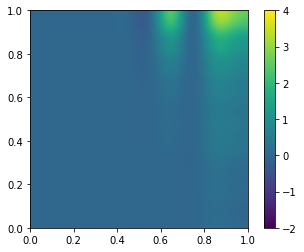

(256, 10) torch.Size([1, 256, 10])


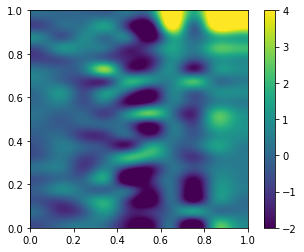

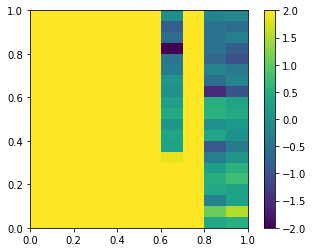

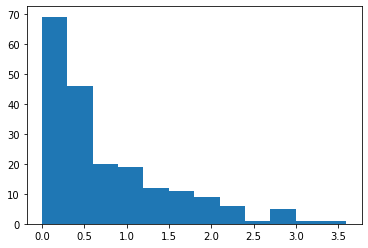

In [ ]:
plot_by_index(ht, X1, 1)

In [ ]:
out2dcpu = (out0[0]*out1[0].argmax(dim=-1,keepdims=True)).detach().cpu().numpy()

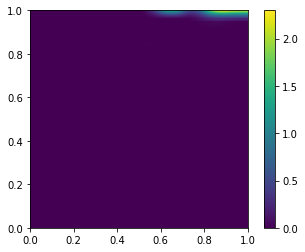

In [ ]:
plt.imshow(out2dcpu,extent=(0,1,0,1),interpolation='quadric')
plt.colorbar()

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:1: RuntimeWarning:

divide by zero encountered in log10



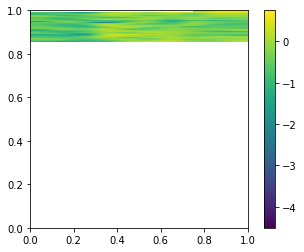

In [ ]:
plt.imshow( np.log10( np.abs(X1[32].detach().cpu().numpy())),extent=(0,1,0,1),interpolation='quadric')
plt.colorbar()

In [ ]:
out2dcpu += 1e-10

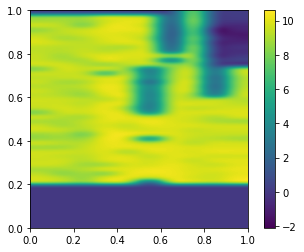

In [ ]:
plt.imshow( np.log10(np.abs(X1[32].detach().cpu().numpy()-out2dcpu)/out2dcpu)[:50],extent=(0,1,0,1),interpolation='quadric')
plt.colorbar()

In [ ]:
(X1[32].detach().cpu().numpy() - out2dcpu)/1e-10

array([[-1.0000000e+00, -1.0000000e+00, -1.0000000e+00, ...,
        -2.6461688e+09,  3.3290824e+10,  3.3374886e+10],
       [-3.0839443e+08, -4.5037270e+08,  3.5324691e+08, ...,
        -7.9595940e+09,  2.3659352e+10,  3.0812416e+10],
       [-8.2755085e+08, -9.5903872e+08,  4.0382147e+08, ...,
        -1.9330468e+10,  2.0336224e+10,  1.7175779e+10],
       ...,
       [-1.0000000e+00, -1.0000000e+00, -1.0000000e+00, ...,
        -1.0000000e+00, -1.0000000e+00, -1.0000000e+00],
       [-1.0000000e+00, -1.0000000e+00, -1.0000000e+00, ...,
        -1.0000000e+00, -1.0000000e+00, -1.0000000e+00],
       [-1.0000000e+00, -1.0000000e+00, -1.0000000e+00, ...,
        -1.0000000e+00, -1.0000000e+00, -1.0000000e+00]], dtype=float32)

In [ ]:
from  torch.utils.data import TensorDataset, DataLoader
BATCH_SIZE = 16

ds = TensorDataset(X1, Mask1)
train_loader  = DataLoader(ds, batch_size = BATCH_SIZE)


for t1, t2 in train_loader:
  print(t1.shape, t2.shape)
  break

torch.Size([16, 256, 10]) torch.Size([16, 256])


In [ ]:
NFEATURES = 10
HIDDEN    = 32

attn_layers = Decoder(
        dim = HIDDEN,
        depth = 8,
        heads = 8,
    )

ht = HaloTransformer( nfeatures=NFEATURES, hidden=HIDDEN, attn_layers=attn_layers)


loss_mse = nn.MSELoss()
loss_ce  = nn.CrossEntropyLoss()

def get_model_loss(model, X_input, M_input, lambda_ce=1.0):
  xi = X_input[:,:-1]
  xo = X_input[:,1: ]
  out, out_mask = model(xi)
  binary_mask = out_mask.argmax(dim=-1).unsqueeze(-1)
  loss1 = loss_mse(out*binary_mask, xo)
  loss2 = lambda_ce*loss_ce(out_mask.transpose(1,2), M_input[:,1:] )

  return loss1+ loss2


# loss = get_model_loss(ht, t1,t2)

In [ ]:
from tqdm.notebook import trange, tqdm

def train_model(model, train_loader, val_loader, optimizer, epochs=3):

  training_loss = []
  testing_loss  = []
  print(epochs)
  for i in trange(epochs, desc='training'):
    model.train()

    loss_float = 0.0
    for c, data in enumerate(train_loader):
      loss = get_model_loss(model, *data)
      loss_float += loss.item()
      loss.backward()
      # if c % 50 == 0:
      #   print(f"{c}/ {len(train_loader)}: iteration: {loss_float}")
    if i % 50 == 0:
      print(f'training loss: {loss_float/len(train_loader)}') 
    training_loss.append(loss_float/len(train_loader))
    torch.nn.utils.clip_grad_norm_(model.parameters(), 0.5)
    optimizer.step()
    optimizer.zero_grad()


    model.eval()
    with torch.no_grad():
      loss_float = 0.0
      for c, data in enumerate(val_loader):
        loss = get_model_loss(model, *data)
        loss_float += loss.item()
        # if c % 50 == 0:
        #   print(f"{c}/ {len(val_loader)}: iteration: {loss_float}")

      if i % 50 == 0:
        print(f'testing loss: {loss_float/len(val_loader)}') 
    testing_loss.append(loss_float/len(train_loader))
    
  return training_loss, testing_loss

from sklearn.model_selection import train_test_split

import torch.optim as optim
from torch.nn import functional as F
from torch.utils.data import DataLoader, Dataset

BATCH_SIZE = 32
X_train, X_test, Mask_train, Mask_test = train_test_split(X1, 
                                                          Mask1, 
                                                          test_size=0.1, 
                                                          random_state = 42)
ds_train = TensorDataset(X_train, Mask_train)
ds_test  = TensorDataset(X_test, Mask_test)

train_loader  = DataLoader(ds_train, batch_size = BATCH_SIZE, shuffle=True)
val_loader    = DataLoader(ds_test, batch_size = BATCH_SIZE,  shuffle=True)

In [ ]:
NFEATURES = 10
HIDDEN    = 16
LEARNING_RATE = 1e-4

# attn_layers = Decoder(
#         dim = HIDDEN,
#         depth = 4,
#         heads = 4,
#     ).to('cuda')

# ht = HaloTransformer( nfeatures=NFEATURES, hidden=HIDDEN, attn_layers=attn_layers).to('cuda')
ht_optimizer = torch.optim.Adam(ht.parameters(), lr=LEARNING_RATE)
train_loss, test_loss = train_model(ht, train_loader, val_loader, optimizer = ht_optimizer, epochs=1000)

1000


training loss: 2.9988887189741593
testing loss: 1.3583197734857861
training loss: 2.781189727495952
testing loss: 1.351962928709231
training loss: 2.8391717819564315
testing loss: 1.3536423225151866
training loss: 2.8417260235691644
testing loss: 1.3508675302329816
training loss: 2.8257986554898413
testing loss: 1.3481660375469608
training loss: 2.8791394526340874
testing loss: 1.3454220467492153
training loss: 2.912827735564795
testing loss: 1.3456193083210994
training loss: 2.9163003384348856
testing loss: 1.343702339812329
training loss: 2.9181138824626625
testing loss: 1.342073109589125
training loss: 2.9166874917874854
testing loss: 1.3394871934464103
training loss: 2.8996489372957184
testing loss: 1.341814354846352
training loss: 2.9110041946531777
testing loss: 1.3374588473847038


KeyboardInterrupt: ignored

(2.5, 4.0)

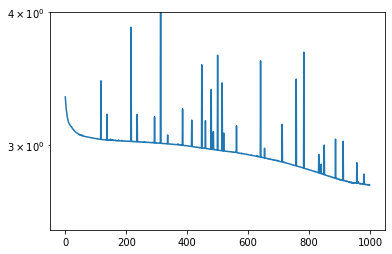

In [ ]:
plt.semilogy(train_loss)
# plt.loglog(test_loss)
# plt.xlim(1e1,1e2)
plt.ylim(2.5, 4.)
# plt.semilogy(np.arange(len(train_loss), step=2), test_loss[::2])

In [ ]:
t_in = t1[:, :-1]
t_out = t1[:, 1:]

t1_model_out, t1_mask_out = ht(t_in)

In [ ]:
binary_mask = t1_mask_out.argmax(dim=-1).unsqueeze(-1)

In [ ]:
for t1, t2 in train_loader:
  t1_model_out, t1_mask_out = ht(t1)
  break

In [ ]:
loss_mse(t1_model_out[10][1:], t_out[3])

tensor(2.3400, device='cuda:0', grad_fn=<MseLossBackward>)

In [ ]:
t_out[3].shape

torch.Size([255, 10])

In [ ]:
loss_mse(t1_model_out[:,1:], t_out)

tensor(2.3330, device='cuda:0', grad_fn=<MseLossBackward>)

In [ ]:
loss_mse(t1_model_out[19][1:], t_out[19])

tensor(2.1869, device='cuda:0', grad_fn=<MseLossBackward>)

In [ ]:
binary_mask.sum(dim=-1).sum(dim=-1)

tensor([ 42,   9,  11,  10,  12,  13,  13,  14,  13,  26,  11,  12,  81,  18,
          9,  11,  72, 255,  29,  12,  13,  33,  25,  18,  11,  49,  40,  98,
         41,  13,  25,  13], device='cuda:0')

In [ ]:
ttt = t1[:, :-1].sum(-1).sum(-1)

In [ ]:
t1[-5][:11]

tensor([[ 0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  3.2244, -1.0252,
          3.3430,  3.2285],
        [ 0.0294,  0.3531, -0.3233,  0.2952,  0.4981,  0.9928,  0.2201, -0.5476,
         -0.0166,  0.0455],
        [-0.3598,  0.0212, -0.1444, -0.5198, -0.9758, -0.0558,  0.0958,  0.3693,
          0.0570,  0.2060],
        [-0.2054,  0.1017,  0.3278,  0.7471, -1.9635,  2.5134, -0.0131, -0.6762,
         -0.2694, -0.1804],
        [-0.2375, -0.0686,  0.4205,  0.3605, -1.3490,  2.7182, -0.3640, -0.1295,
         -0.4473, -0.2469],
        [-0.0152,  0.0973,  0.0971, -0.1627, -1.3378, -0.4209, -0.8784, -0.0174,
          0.1624, -0.1865],
        [-0.2579,  0.0878, -0.1374, -0.0052, -0.5001, -1.0368, -0.9258,  0.9903,
         -0.8966, -0.6129],
        [-0.0305, -0.0479, -0.0929,  1.3255, -0.4865,  0.0511, -0.9846,  0.4818,
         -0.3803, -0.6209],
        [-0.2768, -0.0536, -0.2252,  0.0741, -0.4063, -0.5385, -1.2417,  0.3640,
         -1.0612, -1.6994],
        [-0.0939,  

In [ ]:
binary_mask[-5] - t

tensor([[1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],
        [1],

In [ ]:
# our way of generating the sequence
# start_tokens = torch.from_numpy(normalized_input[0][:2,:][None,:] )

# out = start_tokens
# for i in range(20):
#   logits = ht(out)[:, -1:, :]
#   out = torch.cat( (out, new_logits), dim=1)


In [ ]:
def generate(start_tokens, seq_len, 
             eos_token = None, temperature = 1., 
             filter_logits_fn = top_k, filter_thres = 0.9):
  was_training = self.net.training
  num_dims = len(start_tokens.shape)

  if num_dims == 1:
      start_tokens = start_tokens[None, :]

  b, t = start_tokens.shape

  self.net.eval()
  out = start_tokens
  mask = kwargs.pop('mask', None)

  if mask is None:
      mask = torch.full_like(out, True, dtype=torch.bool, device=out.device)

  for _ in range(seq_len):
      x = out[:, -self.max_seq_len:]
      mask = mask[:, -self.max_seq_len:]

      logits = self.net(x, mask=mask, **kwargs)[:, -1, :]
      filtered_logits = filter_logits_fn(logits, thres = filter_thres)
      probs = F.softmax(filtered_logits / temperature, dim=-1)
      sample = torch.multinomial(probs, 1)

      out = torch.cat((out, sample), dim=-1)
      mask = F.pad(mask, (0, 1), value=True)

      if eos_token is not None and (sample == eos_token).all():
          break

  out = out[:, t:]

  if num_dims == 1:
      out = out.squeeze(0)

  self.net.train(was_training)
  return out

tensor([[[True, True, True,  ..., True, True, True],
         [True, True, True,  ..., True, True, True],
         [True, True, True,  ..., True, True, True],
         ...,
         [True, True, True,  ..., True, True, True],
         [True, True, True,  ..., True, True, True],
         [True, True, True,  ..., True, True, True]]])

In [ ]:
from x_transformers import TransformerWrapper, Decoder
from x_transformers.autoregressive_wrapper import AutoregressiveWrapper

import random
import tqdm
import gzip
import numpy as np
import torch
import torch.optim as optim
from torch.nn import functional as F
from torch.utils.data import DataLoader, Dataset

# constants

NUM_BATCHES = int(1e5)
BATCH_SIZE = 4
GRADIENT_ACCUMULATE_EVERY = 4
LEARNING_RATE = 1e-4
VALIDATE_EVERY  = 100
GENERATE_EVERY  = 500
GENERATE_LENGTH = 1024
SEQ_LEN = 1024

# helpers

def cycle(loader):
    while True:
        for data in loader:
            yield data

def decode_token(token):
    return str(chr(max(32, token)))

def decode_tokens(tokens):
    return ''.join(list(map(decode_token, tokens)))

# instantiate GPT-like decoder model

model = TransformerWrapper(
    num_tokens = 256,
    max_seq_len = SEQ_LEN,
    attn_layers = Decoder(dim = 512, depth = 6, heads = 8),
)

model = AutoregressiveWrapper(model)
# model.cuda()

# prepare enwik8 data

with gzip.open('x-transformers/examples/enwik8_simple/data/enwik8.gz') as file:
    X = np.fromstring(file.read(int(95e6)), dtype=np.uint8)
    trX, vaX = np.split(X, [int(90e6)])
    data_train, data_val = torch.from_numpy(trX), torch.from_numpy(vaX)

class TextSamplerDataset(Dataset):
    def __init__(self, data, seq_len):
        super().__init__()
        self.data = data
        self.seq_len = seq_len

    def __getitem__(self, index):
        rand_start = torch.randint(0, self.data.size(0) - self.seq_len - 1, (1,))
        full_seq = self.data[rand_start: rand_start + self.seq_len + 1].long()
        return full_seq #.cuda()

    def __len__(self):
        return self.data.size(0) // self.seq_len

train_dataset = TextSamplerDataset(data_train, SEQ_LEN)
val_dataset   = TextSamplerDataset(data_val, SEQ_LEN)
train_loader  = cycle(DataLoader(train_dataset, batch_size = BATCH_SIZE))
val_loader    = cycle(DataLoader(val_dataset, batch_size = BATCH_SIZE))

# optimizer

optim = torch.optim.Adam(model.parameters(), lr=LEARNING_RATE)



/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:54: UserWarning:

The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:141.)



tensor([ 10,  10,  72,  ...,  32,  84, 104])

In [ ]:
# dim = attn_layers.dim
# self.max_seq_len = max_seq_len
# self.token_emb = nn.Embedding(num_tokens, dim)
# self.pos_emb = nn.Embedding(max_seq_len, dim)
# self.emb_dropout = nn.Dropout(emb_dropout)

# x = self.token_emb(x)
# x += self.pos_emb(torch.arange(n, device = device))
# x = self.emb_dropout(x)


In [ ]:
emb1 = nn.Embedding(3,213)

emb1(torch.randint(0,3, (1,1024)))

tensor([[[-0.2594, -0.2751, -0.8421,  ...,  0.7477, -0.1623,  0.0922],
         [-0.9179,  0.1150, -0.6879,  ...,  0.7470,  0.6119, -0.5049],
         [-0.2594, -0.2751, -0.8421,  ...,  0.7477, -0.1623,  0.0922],
         ...,
         [-0.2594, -0.2751, -0.8421,  ...,  0.7477, -0.1623,  0.0922],
         [-0.9179,  0.1150, -0.6879,  ...,  0.7470,  0.6119, -0.5049],
         [-0.9179,  0.1150, -0.6879,  ...,  0.7470,  0.6119, -0.5049]]],
       grad_fn=<EmbeddingBackward>)

In [ ]:
# so the transfomer input is [BATCHSIZE, SEQ_LENGTH]

x = next(train_loader)
print(x.shape, x.max(), x.min() )

torch.Size([4, 1025]) tensor(195) tensor(10)


In [ ]:
for i in tqdm.tqdm(range(NUM_BATCHES), mininterval=10., desc='training'):
    model.train()

    for __ in range(GRADIENT_ACCUMULATE_EVERY):
        loss = model(next(train_loader))
        loss.backward()

    print(f'training loss: {loss.item()}')
    torch.nn.utils.clip_grad_norm_(model.parameters(), 0.5)
    optim.step()
    optim.zero_grad()

    if i % VALIDATE_EVERY == 0:
        model.eval()
        with torch.no_grad():
            loss = model(next(val_loader))
            print(f'validation loss: {loss.item()}')

    if i % GENERATE_EVERY == 0:
        model.eval()
        inp = random.choice(val_dataset)[:-1]
        prime = decode_tokens(inp)
        print(f'%s \n\n %s', (prime, '*' * 100))

        sample = model.generate(inp, GENERATE_LENGTH)
        output_str = decode_tokens(sample)
        print(output_str)

training:   0%|          | 0/100000 [00:00<?, ?it/s]

training loss: 5.636302947998047
validation loss: 4.545037746429443
%s 

 %s ('e Tigris and Euphrates also carry large quantities of salts. These, too, are spread on the land by sometimes excessive irrigation and flooding. A high water table and poor surface and subsurface drainage tend to concentrate the salts near the surface of the soil. In general, the salinity of the soil increases from Baghdad south to the Persian Gulf and severely limits productivity in the region south of Al Amarah. The salinity is reflected in the large lake in central Iraq, southwest of Baghdad, known as Bahr al Milh (Sea of Salt). There are two other major lakes in the country to the north of Bahr al Milh: Buhayrat ath Tharthar and Buhayrat al Habbaniyah.  The Euphrates originates in Turkey, is augmented by the Nahr (river) al Khabur in Syria, and enters Iraq in the northwest. Here it is fed only by the wadis of the western desert during the winter rains. It then winds through a gorge, which varies from two 

KeyboardInterrupt: ignored

In [ ]:
class AutoregressiveWrapper(nn.Module):
    def __init__(self, net, ignore_index = -100, pad_value = 0):
        super().__init__()
        self.pad_value = pad_value
        self.ignore_index = ignore_index

        self.net = net
        self.max_seq_len = net.max_seq_len

    @torch.no_grad()
    def generate(self, start_tokens, seq_len, eos_token = None, temperature = 1., filter_logits_fn = top_k, filter_thres = 0.9, **kwargs):
        was_training = self.net.training
        num_dims = len(start_tokens.shape)

        if num_dims == 1:
            start_tokens = start_tokens[None, :]

        b, t = start_tokens.shape

        self.net.eval()
        out = start_tokens
        mask = kwargs.pop('mask', None)

        if mask is None:
            mask = torch.full_like(out, True, dtype=torch.bool, device=out.device)

        for _ in range(seq_len):
            x = out[:, -self.max_seq_len:]
            mask = mask[:, -self.max_seq_len:]

            logits = self.net(x, mask=mask, **kwargs)[:, -1, :]
            filtered_logits = filter_logits_fn(logits, thres = filter_thres)
            probs = F.softmax(filtered_logits / temperature, dim=-1)
            sample = torch.multinomial(probs, 1)

            out = torch.cat((out, sample), dim=-1)
            mask = F.pad(mask, (0, 1), value=True)

            if eos_token is not None and (sample == eos_token).all():
                break

        out = out[:, t:]

        if num_dims == 1:
            out = out.squeeze(0)

        self.net.train(was_training)
        return out

    def forward(self, x, **kwargs):
        pad = partial(pad_sequence, batch_first = True, padding_value = self.pad_value)

        xi = x[:, :-1]
        xo = x[:, 1:]

        # help auto-solve a frequent area of confusion around input masks in auto-regressive
        # if user supplies a mask that is only off by one from the source sequence, resolve it for them
        mask = kwargs.pop('mask', None)
        if mask is not None and mask.shape[1] == x.shape[1]:
            mask = mask[:, :-1]
            kwargs.update(mask = mask)

        out = self.net(xi, **kwargs)
        loss = F.cross_entropy(out.transpose(1, 2), xo, ignore_index = self.ignore_index)
        return loss

In [ ]:
arht = AutoregressiveWrapper(ht)

ModuleAttributeError: ignored

In [ ]:
class AutoregressiveWrapper(nn.Module):
    def __init__(self, net, ignore_index = -100, pad_value = 0):
        super().__init__()
        self.pad_value = pad_value
        self.ignore_index = ignore_index

        self.net = net

    @torch.no_grad()
    def generate(self, start_tokens, seq_len, eos_token = None, 
                 temperature = 1., filter_logits_fn = top_k, filter_thres = 0.9, **kwargs):
        was_training = self.net.training
        num_dims = len(start_tokens.shape)

        if num_dims == 1:
            start_tokens = start_tokens[None, :]

        b, t = start_tokens.shape

        self.net.eval()
        out = start_tokens
        mask = kwargs.pop('mask', None)

        if mask is None:
            mask = torch.full_like(out, True, dtype=torch.bool, device=out.device)

        for _ in range(seq_len):
            x = out[:, -self.max_seq_len:]
            mask = mask[:, -self.max_seq_len:]

            logits = self.net(x, mask=mask, **kwargs)[:, -1, :]
            filtered_logits = filter_logits_fn(logits, thres = filter_thres)
            probs = F.softmax(filtered_logits / temperature, dim=-1)
            sample = torch.multinomial(probs, 1)

            out = torch.cat((out, sample), dim=-1)
            mask = F.pad(mask, (0, 1), value=True)

            if eos_token is not None and (sample == eos_token).all():
                break

        out = out[:, t:]

        if num_dims == 1:
            out = out.squeeze(0)

        self.net.train(was_training)
        return out

    def forward(self, x, **kwargs):
        pad = partial(pad_sequence, batch_first = True, padding_value = self.pad_value)

        xi = x[:, :-1]
        xo = x[:, 1:]

        # help auto-solve a frequent area of confusion around input masks in auto-regressive
        # if user supplies a mask that is only off by one from the source sequence, resolve it for them
        mask = kwargs.pop('mask', None)
        if mask is not None and mask.shape[1] == x.shape[1]:
            mask = mask[:, :-1]
            kwargs.update(mask = mask)

        out = self.net(xi, **kwargs)
        loss = F.cross_entropy(out.transpose(1, 2), xo, ignore_index = self.ignore_index)
        return loss